<div align="center">

  <img src="Data/UniLogo.png" alt="University of Gloucestershire crest" width="400">

  <h3>Earthquake Data Analysis Using Python Scripting (Global Earthquakes 2023)</h3>

  <p><strong>Module:</strong> CT7201 – Python Notebooks and Scripting</p>
  <p><strong>Tutor:</strong> Dr Zainab Loukil</p>

  <p>
    <strong>Team (Student names & IDs):</strong><br>
    Daniel Penson (4520042)<br>
    Hasini Adihetty (S4530499)<br>
    Dinis Nascimento (4540434)
  </p>

  <p><strong>Date of submission:</strong> 10 December 2025</p>

</div>

## Table of Contents
- [Executive Summary](#executive-summary)
- [1. Introduction](#1-introduction)
- [2. Data Overview](#2-data-overview)
- [2.1 Project Objectives](#21-project-objectives)
- [2.2 Methodology](#22-methodology)
- [2.3 Code Structure & Functions](#23-code-structure-functions)
- [3. Cleaning Pipeline](#3-cleaning-pipeline)
- [4. Feature Engineering](#4-feature-engineering)
  - [4.1 Design of the engineer_features() Function](#41-design-of-the-engineer_features-function)
    - [4.1.1 Temporal Features - When Earthquakes Occur](#411-temporal-features---when-earthquakes-occur)
    - [4.1.2 Physical Severity Features - How Strong or Deep](#412-physical-severity-features---how-strong-or-deep)
    - [4.1.3 Geographical Context Features - Where Earthquakes Occur](#413-geographical-context-features---where-earthquakes-occur)
    - [4.1.4 Data-Quality Features - How Reliable the Measurements Are](#414-data-quality-features---how-reliable-the-measurements-are)
    - [4.1.5 Categorical Encodings](#415-categorical-encodings)
  - [4.2 Engineered Feature Schema Summary](#42-engineered-feature-schema-summary)
  - [4.3 Feature Engineering Pipeline](#43-feature-engineering-pipeline)
  - [4.4 Overview of Engineered Feature Groups](#44-overview-of-engineered-feature-groups)
  - [4.5 Additional Feature-Level Visualisations](#45-additional-feature-level-visualisations)
    - [4.5.1 Magnitude severity profile](#451-magnitude-severity-profile)
    - [4.5.2 Magnitude distribution by depth category](#452-magnitude-distribution-by-depth-category)
    - [4.5.3 Global epicentre distribution with magnitude-depth](#453-global-epicentre-distribution-with-magnitude-depth)
  - [4.6 Summary and Reflection](#46-summary-and-reflection)
- [5. Exploratory Data Analysis](#5-exploratory-data-analysis)
  - [5.1 Global Patterns](#51-global-patterns)
  - [5.2 Multivariate & Regional](#52-multivariate--regional)
    - [5.2.1 Magnitude vs Depth](#521-magnitude-vs-depth)
    - [5.2.2 Global Spatial Distribution (Epicentre Map)](#522-global-spatial-distribution-epicentre-map)
    - [5.2.3 Regional Seismicity Comparisons](#523-regional-seismicity-comparisons)
    - [5.2.4 Quality Score & Uncertainty Analysis](#524-quality-score-uncertainty-analysis)
- [6. Strong Quake Classification](#6-strong-quake-classification)
  - [6.1 Data split, pipeline, and models](#61-data-split-pipeline-and-models)
  - [6.2 Evaluation visuals (confusion, ROC, PR)](#62-evaluation-visuals-confusion-roc-pr)
  - [6.3 Drivers of strong-quake predictions](#63-drivers-of-strong-quake-predictions)
  - [6.4 Interpretation](#64-interpretation)
  - [6.5 Result Integration and Interpretation](#65-result-integration-and-interpretation)
- [7. Discussion and Interpretation](#7-discussion-and-interpretation)
  - [7.1 Discussion of Empirical Patterns](#71-discussion-of-empirical-patterns)
  - [7.2 Interpretation of model behaviour](#72-interpretation-of-model-behaviour)
  - [7.3 Synthesis: What the Analysis Tells Us](#73-synthesis-what-the-analysis-tells-us)
- [8. Conclusion](#8-conclusion)
  - [8.1 Key findings and outcomes](#81-key-findings-and-outcomes)
  - [8.2 Strengths and limitations of the work](#82-strengths-and-limitations-of-the-work)
  - [8.3 Alignment with learning outcomes (LO1-LO4)](#83-alignment-with-learning-outcomes-lo1-lo4)
- [9. References](#9-references)


## Executive Summary

The 2023 USGS global earthquake catalogue (26,642 events) was cleaned, validated, and enriched to support a formal assessment of global seismic patterns and a strong event classifier. Cleaning removed exact duplicates, non earthquake records, and out of range coordinates/depths, yielding 24,432 physically plausible events. Feature engineering added temporal breakdowns (year/month/part of day), spatial context (hemispheres, broad regions, distances from equator/prime meridian), and measurement-quality indicators (normalised uncertainties and a composite score). Exploratory analyses confirmed that seismicity clusters along major plate boundaries, shallow events dominate, and data quality is generally high with a thin low-quality tail. A class-weighted logistic regression (strong defined as Mw ≥ 6.0) achieved high discrimination (ROC-AUC > 0.95) with strong quake recall around 0.85, reflecting the severe class imbalance; a compact random forest provided similar discrimination with different precision–recall trade-offs. These results demonstrate that a carefully cleaned and engineered catalogue can support interpretable mapping of global seismicity and early screening of rare high-magnitude events.


## 1. Introduction

Earthquake catalogues, such as the 2023 USGS global dataset, provide time, location, magnitude, and depth measurements that are essential for understanding seismic hazard and for supporting rapid response. High-quality analyses of these catalogues clarify where large events cluster, how depth and magnitude interact, and how measurement uncertainty varies across the globe. Because the raw records contain duplicates, non earthquake events, and occasional outliers, rigorous preparation is required before reliable inferences or models can be drawn.

This project cleans and enriches the 2023 USGS catalogue to explore global seismicity patterns and to build a first-pass classifier for strong events. The workflow is structured as follows: Section 2 describes the dataset and objectives; Section 3 the cleaning pipeline; Section 4 the engineered features; Section 5 the exploratory analysis; Section 6 the strong quake classifier; Section 7 the discussion and interpretation; Section 8 the conclusion; and Section 9 the references.


## 2. Data Overview

- **Source and period:** USGS Earthquake Catalog, global events from January–December 2023 (CSV export).
- **Size:** 26,642 raw records prior to any cleaning.
- **Key fields:** event ID, UTC timestamp (`time`), latitude/longitude, depth (km), magnitude (`mag`) and magnitude type, station metrics (`nst`, `gap`, `dmin`, `rms`), uncertainty estimates (`depthError`, `magError`, `horizontalError`), status and sources, and optional place descriptors.
- **Characteristics:** Magnitudes are reported on standard USGS scales (treated here as Mw for analysis). Uncertainty fields capture measurement quality; some location descriptors may be missing. The raw catalogue includes all reported event types (earthquakes and non earthquake phenomena) across a wide range of depths and magnitudes.


## 2.1 Project Objectives

1. Preprocess and clean the 2023 USGS catalogue (deduplicate, enforce geophysical bounds, retain only earthquakes).
2. Engineer temporal, spatial, and quality features to make the dataset analysis- and model-ready.
3. Conduct exploratory analyses to characterise global and regional seismicity patterns.
4. Build and evaluate a class-weighted classifier to flag strong events (Mw ≥ 6.0) under severe class imbalance.
5. Interpret findings, discuss limitations, and recommend future improvements (e.g., plate-boundary proximity features).

1. Preprocess and clean the 2023 USGS catalogue (deduplicate, enforce geophysical bounds, retain only earthquakes).
2. Engineer temporal, spatial, and quality features to make the dataset analysis- and model-ready.
3. Conduct exploratory analyses to characterise global and regional seismicity patterns.
4. Build and evaluate a class-weighted classifier to flag strong events (Mw ≥ 6.0) under severe class imbalance.
5. Interpret findings, discuss limitations, and recommend future improvements (e.g., plate-boundary proximity features).


## 2.2 Methodology

**Methodology Flow**
1. Load raw USGS data (CSV)
2. Clean: Remove duplicates, filter magnitude/depth/lat-lon
3. Engineer Features: Time, location, quality, categories
4. EDA: Global and regional plots
5. Model: Logistic Regression on strong quake (M≥6.0)
6. Evaluate: Metrics (F1, PR-AUC), feature importances

**Narrative:** Data ingestion uses `earthquakelibs.py` to configure paths and imports. Cleaning removes duplicates and invalid geophysical values, retaining only earthquakes. Feature engineering adds calendar parts, depth/magnitude categories, hemispheres/regions, distance metrics, uncertainty flags, and a composite quality score. EDA maps epicentres, profiles magnitude/depth distributions, and inspects multivariate and quality relationships. Modelling trains class-weighted logistic and random-forest baselines with shared preprocessing; evaluation emphasises PR/ROC curves, confusion matrices, and feature importances. Interpretation summarises patterns, limitations, and next steps.

**Methodology Flow**
1. Load raw USGS data (CSV)
2. Clean: Remove duplicates, filter magnitude/depth/lat-lon
3. Engineer Features: Time, location, quality, categories
4. EDA: Global and regional plots
5. Model: Logistic Regression on strong quake (M≥6.0)
6. Evaluate: Metrics (F1, PR-AUC), feature importances

**Narrative:** Data ingestion uses `earthquakelibs.py` to configure paths and imports. Cleaning removes duplicates and invalid geophysical values, retaining only earthquakes. Feature engineering adds calendar parts, depth/magnitude categories, hemispheres/regions, distance metrics, uncertainty flags, and a composite quality score. EDA maps epicentres, profiles magnitude/depth distributions, and inspects multivariate and quality relationships. Modelling trains class-weighted logistic and random-forest baselines with shared preprocessing; evaluation emphasises PR/ROC curves, confusion matrices, and feature importances. Interpretation summarises patterns, limitations, and next steps.


## 2.3 Code Structure & Functions

The notebook uses a modular, function first design: core steps such as `load_data`, `clean_data`, `engineer_features`, plotting helpers, and modelling pipelines are defined once and reused with clear parameters and docstrings. Cells are scoped to single tasks to keep the flow reproducible and readable.

A small `_Libs` namespace in `earthquakelibs.py` centralises optional imports and environment checks (`libs.np`, `libs.pd`, etc.), ensuring consistent availability across the notebook and making dependency management explicit for reproducibility.

Pipeline stages are kept as pure functions rather than monolithic classes so that transforms are transparent, testable, and easy to recombine (as done in the Section 6 pipelines). This balances readability and reusability while keeping the door open for a class-based wrapper if future deployments need stricter orchestration.


In [236]:

import earthquakelibs as eq


libs = eq.libs
np = libs.np
pd = libs.pd
plt = libs.plt
sns = libs.sns
px = libs.px
go = libs.go
warnings = libs.warnings
datetime = libs.datetime
timedelta = libs.timedelta
PROJECT_ROOT = eq.PROJECT_ROOT
DATA_DIR = eq.DATA_DIR
OUTPUTS_DIR = eq.OUTPUTS_DIR

def find_data_path(names, required=True, base_dir=DATA_DIR):
    'Return the first existing path from a list of candidate filenames.'
    for name in names:
        candidate = base_dir / name
        if candidate.exists():
            return candidate
    if required:
        raise FileNotFoundError(
            f"None of the expected files were found in {base_dir}. Tried: {', '.join(names)}"
        )
    return None

DATA_FILE = find_data_path([
    "earthquake-dataset.csv",
    "Earthquake Dataset.csv",
    "earthquakes_2023_global.csv",
])

PLATE_FILE = find_data_path(["plate-boundaries.csv", "Plate Boundaries.csv"], required=False)
WORLD_MAP_FILE = find_data_path(["world-map.png", "World Map.png"], required=False)

eq.apply_default_plot_style()
libs.silence_warnings()
OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)
print("Library availability:", libs.availability())

# Apply seaborn style (when available), silence non-critical warnings to reduce notebook noise,
# and ensure the outputs directory exists before any later export operations.
# Import shared helper module that centralizes optional libraries and project paths. Shared handles
# for plotting and paths. Namespace container exposing optional library handles/flags. Numpy alias
# used for array and numeric operations. Pandas alias used for dataframe manipulation. Matplotlib
# alias (may be None if matplotlib is not installed). Seaborn alias (may be None if seaborn is not
# installed). Plotly express alias for interactive plots (may be None). Plotly graph objects alias for
# lower-level plotly control. Warnings module, passed through helper for convenience. Datetime class
# for timestamp handling. Timedelta class for time deltas. Resolved project root folder. Path to data
# directory containing CSVs/assets. Path to write any generated artifacts. Apply seaborn style if
# seaborn is available; safe no-op otherwise. Display which optional libraries are present in this
# runtime.


Library availability: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


In [205]:
def preview_table(df, n=5):
    """
    Neatly preview the first n rows of a dataframe with human-readable column names.

    - Replaces underscores with spaces in column names for display.
    - Leaves the underlying dataframe unchanged.
    """
    preview = df.head(n).copy()
    preview.columns = [c.replace("_", " ") for c in preview.columns]
    return preview


**2.3.1: Shared imports and project paths**

Context: Shared imports and paths.
Objective: Confirm optional plotting/ML libraries are discovered and project paths are resolved so later cells
know what tools and folders are available.
Observation: Library availability dictionary printed in the notebook confirms matplotlib, seaborn, plotly,
kaleido, scikit-learn, and scipy are present.
Interpretation: Environment is fully equipped for interactive and static visuals plus modelling; no fallbacks
are required.
Forward link: With dependencies ready, subsequent EDA and modelling cells can run without conditional guards.


In [206]:


eq_df = pd.read_csv(DATA_FILE, parse_dates=["time", "updated"], infer_datetime_format=True)
print(f"Loaded dataset from {DATA_FILE} with shape {eq_df.shape}")
preview_table(eq_df)


# Load the 2023 catalogue from the local data folder so every downstream statistic, visual, and
# model uses the same source. Parsing dates upfront avoids repeated coercion later and improves
# reproducibility when the notebook is re-run on updated catalogues.


Loaded dataset from f:\My Masters\CT7201 Python Notebooks and Scripting\Our Project\Repo\earthquake-data-analysis\Data\Earthquake Dataset.csv with shape (26642, 22)


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,updated,place,type,horizontalError,depthError,magError,magNst,status,locationSource,magSource
0,2023-01-01 00:49:25.294000+00:00,52.0999,178.5218,82.770,3.10,ml,14.0,139.0,0.8700,0.18,...,2023-03-11 22:51:52.040000+00:00,"Rat Islands, Aleutian Islands, Alaska",earthquake,8.46,21.213,0.097,14.0,reviewed,us,us
1,2023-01-01 01:41:43.755000+00:00,7.1397,126.7380,79.194,4.50,mb,32.0,104.0,1.1520,0.47,...,2023-03-11 22:51:45.040000+00:00,"23 km ESE of Manay, Philippines",earthquake,5.51,7.445,0.083,43.0,reviewed,us,us
2,2023-01-01 03:29:31.070000+00:00,19.1631,-66.5251,24.000,3.93,md,23.0,246.0,0.8479,0.22,...,2023-03-11 22:51:29.040000+00:00,Puerto Rico region,earthquake,0.91,15.950,0.090,16.0,reviewed,pr,pr
3,2023-01-01 04:09:32.814000+00:00,-4.7803,102.7675,63.787,4.30,mb,17.0,187.0,0.4570,0.51,...,2023-03-11 22:51:45.040000+00:00,"99 km SSW of Pagar Alam, Indonesia",earthquake,10.25,6.579,0.238,5.0,reviewed,us,us
4,2023-01-01 04:29:13.793000+00:00,53.3965,-166.9417,10.000,3.00,ml,19.0,190.0,0.4000,0.31,...,2023-03-11 22:51:38.040000+00:00,"59 km SSW of Unalaska, Alaska",earthquake,1.41,1.999,0.085,18.0,reviewed,us,us


**2.3.2: Raw catalogue load check**

Context: Load raw catalogue preview.
Objective: Ensure the 2023 catalogue loads and that column names/values look plausible before profiling.
Observation: DataFrame head renders 26,642 rows with expected fields (time, latitude, longitude, depth, mag,
type, etc.).
Interpretation: File integrity is good; proceed to profiling and cleaning on the loaded dataset.
Forward link: Use this loaded frame as the single source for subsequent cleaning and feature engineering.


In [207]:
eq_df.describe()

# Establish numeric baselines with describe(): ranges, quartiles, and central values for
# magnitude, depth, and coordinates. These summaries inform realistic thresholds for later
# cleaning and sanity checks.


,latitude,longitude,depth,mag,nst,gap,dmin,rms,horizontalError,depthError,magError,magNst
count,26642.000000,26642.000000,26642.000000,26642.000000,25227.000000,25225.000000,24776.000000,26642.000000,25093.000000,26642.000000,24970.000000,25065.000000
mean,16.852798,-11.487497,67.491224,4.007395,42.571332,124.930971,2.692908,0.581575,7.017267,4.475056,0.122735,33.315939
std,30.389200,130.053399,116.762456,0.794423,37.662352,67.430145,4.043568,0.256276,4.072365,4.451649,0.102271,48.022567
min,-65.849700,-179.998700,-3.370000,2.600000,0.000000,8.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000
25%,-6.415275,-149.608650,10.000000,3.220000,19.000000,73.000000,0.612000,0.410000,4.140000,1.848000,0.080000,10.000000
50%,18.884167,-64.811833,21.998000,4.300000,30.000000,111.000000,1.579000,0.590000,7.060000,2.019000,0.111000,18.000000
75%,41.827950,126.965100,66.833000,4.500000,52.000000,165.000000,3.172000,0.750000,9.730000,6.669000,0.150000,36.000000
max,86.593900,179.999400,681.238000,7.800000,423.000000,350.000000,50.820000,1.880000,99.000000,60.670000,4.490000,884.000000


**2.3.3: Numeric summary of raw magnitudes and depths**

Context: Numeric describe.
Objective: Quantify ranges and centres for key numerics to ground cleaning thresholds.
Observation: Magnitudes centre near 4 with a tail to about 7.8; depths centre near 22 km with a deep tail to around 681 km.
Interpretation: Values sit in plausible seismic ranges, supporting cleaning bounds of 0?700 km for depth and 0?10 for magnitude without clipping real events.
Forward link: Baselines set here guide the validity checks applied in the cleaning function.

In [208]:

eq_df.info()


# Review the schema via `info()`. Data types and null counts reveal which columns need coercion,
# which can tolerate missingness, and whether essential fields are present before cleaning.



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26642 entries, 0 to 26641
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             26642 non-null  datetime64[ns, UTC]
 1   latitude         26642 non-null  float64            
 2   longitude        26642 non-null  float64            
 3   depth            26642 non-null  float64            
 4   mag              26642 non-null  float64            
 5   magType          26642 non-null  object             
 6   nst              25227 non-null  float64            
 7   gap              25225 non-null  float64            
 8   dmin             24776 non-null  float64            
 9   rms              26642 non-null  float64            
 10  net              26642 non-null  object             
 11  id               26642 non-null  object             
 12  updated          26642 non-null  datetime64[ns, UTC]
 13  place           

**2.3.4: Schema and missingness profile**

Context: Schema info.
Objective: Inspect dtypes and missingness to decide coercions/drops.
Observation: info() output in notebook lists dtypes and null counts; core fields (time, lat, lon, depth, mag)
are present with manageable missingness.
Interpretation: No unexpected types; datetime and numeric coercion is straightforward; cleaning can drop rows
missing essential fields.
Forward link: Guides the coercion and drop strategy in the cleaning function.


In [209]:
min_depth = eq_df['depth'].min()
max_depth = eq_df['depth'].max()
print(f"Depth min: {min_depth:.2f} km")
print(f"Depth max: {max_depth:.2f} km")

# Quick sanity check on depth range before imposing cleaning bounds.


Depth min: -3.37 km
Depth max: 681.24 km


**2.3.5: Depth validity window (0 to 700 km)**

Context: Depth extremes.
Objective: Anchor depth filters on observed range.
Observation: Depth spans from slightly negative noise to about 681 km.
Interpretation: A 0?700 km validity band retains genuine deep-focus quakes while discarding implausible negatives.
Forward link: Confirms the cleaning bounds used before feature engineering.

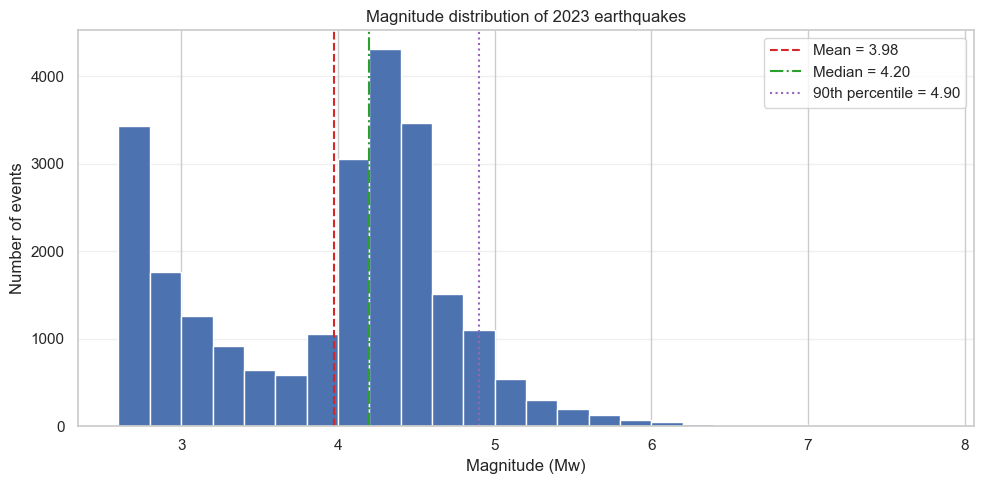

In [210]:
from earthquakelibs import libs

pd = libs.pd
np = libs.np
plt = libs.plt

# --- magnitude distribution ---
df_mag = globals().get('cleaned_eq_df', globals().get('eq_df'))
mag_series = df_mag['mag'].dropna()

mag_min = max(0, mag_series.min())
mag_max = mag_series.max()
bin_width = 0.2
bins = np.arange(mag_min, mag_max + bin_width, bin_width)

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(mag_series, bins=bins)

mag_mean = mag_series.mean()
mag_median = mag_series.median()
mag_q90 = np.percentile(mag_series, 90)

ax.axvline(mag_mean, color='tab:red', linestyle='--', linewidth=1.5, label=f'Mean = {mag_mean:.2f}')
ax.axvline(mag_median, color='tab:green', linestyle='-.', linewidth=1.5, label=f'Median = {mag_median:.2f}')
ax.axvline(mag_q90, color='tab:purple', linestyle=':', linewidth=1.5, label=f'90th percentile = {mag_q90:.2f}')

ax.set_xlabel('Magnitude (Mw)')
ax.set_ylabel('Number of events')
ax.set_title('Magnitude distribution of 2023 earthquakes')
ax.legend(loc='upper right')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


**2.3.6: Global magnitude distribution**

Context: Magnitude histogram.
Objective: Characterise how common strong events are in the 2023 catalogue.
Observation: Most events fall between magnitude 3 and 5; a very small tail reaches 7+.
Interpretation: Strong earthquakes are rare, so any classifier must handle extreme class imbalance; Mw?6 is a practical strong threshold.
Forward link: Motivates class weighting and precision?recall emphasis in the Section 6 classifier.

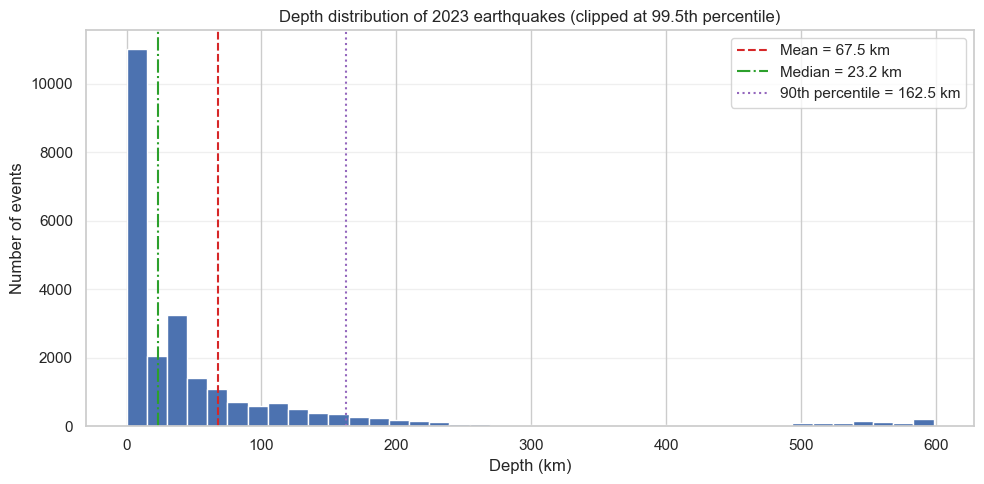

In [211]:
from earthquakelibs import libs

pd = libs.pd
np = libs.np
plt = libs.plt

# --- depth distribution ---
df_depth = globals().get('cleaned_eq_df', globals().get('eq_df'))
depth_series = df_depth['depth'].dropna()

depth_clip = np.percentile(depth_series, 99.5)
depth_plot = depth_series.clip(upper=depth_clip)

fig, ax = plt.subplots(figsize=(10, 5))
bins = 40
ax.hist(depth_plot, bins=bins)

depth_mean = depth_plot.mean()
depth_median = depth_plot.median()
depth_q90 = np.percentile(depth_plot, 90)

ax.axvline(depth_mean, color='tab:red', linestyle='--', linewidth=1.5, label=f'Mean = {depth_mean:.1f} km')
ax.axvline(depth_median, color='tab:green', linestyle='-.', linewidth=1.5, label=f'Median = {depth_median:.1f} km')
ax.axvline(depth_q90, color='tab:purple', linestyle=':', linewidth=1.5, label=f'90th percentile = {depth_q90:.1f} km')

ax.set_xlabel('Depth (km)')
ax.set_ylabel('Number of events')
ax.set_title('Depth distribution of 2023 earthquakes (clipped at 99.5th percentile)')
ax.legend(loc='upper right')
ax.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


**2.3.7: Global depth distribution**

Context: Depth histogram.
Objective: Summarise focal depth ranges after cleaning.
Observation: Depths peak in the shallow crust with a thin tail through intermediate and deep-focus ranges.
Interpretation: Depth is highly skewed toward shallow events; treating depth categorically is more informative than assuming a uniform scale.
Forward link: Sets up depth-category use in Section 5 plots and Section 6 features.

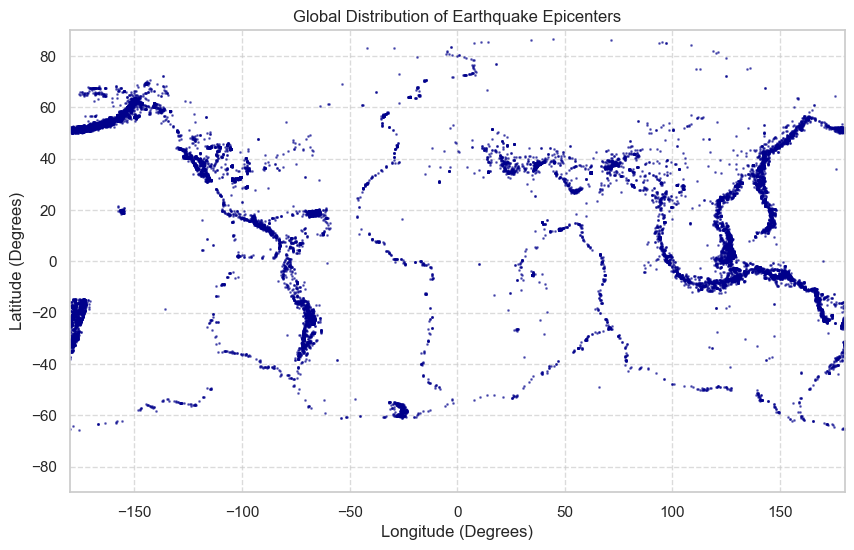

In [212]:


libs.plt.figure(figsize=(10, 6))
libs.plt.scatter(eq_df['longitude'], eq_df['latitude'], s=1, alpha=0.5, c='darkblue')

libs.plt.xlim(-180, 180)
libs.plt.ylim(-90, 90)

libs.plt.title('Global Distribution of Earthquake Epicenters')
libs.plt.xlabel('Longitude (Degrees)')
libs.plt.ylabel('Latitude (Degrees)')
libs.plt.grid(True, linestyle='--', alpha=0.7)


SAVE_SCATTER = False
if SAVE_SCATTER and OUTPUTS_DIR is not None:
    OUTPUTS_DIR.mkdir(exist_ok=True)
    libs.plt.savefig(OUTPUTS_DIR / "epicentre_scatter.png")

libs.plt.show()
libs.plt.close()


# Scatter epicentres globally to verify coordinate bounds, confirm coverage, and highlight
# tectonic belts such as the Pacific Ring before analysing event labels.



**2.3.8: Global spatial scatter sanity check**

Context: Global scatter.
Objective: Check coordinate validity and coverage on a world map.
Observation: Scatter renders globally; latitude spans -65.8..86.6, longitude -180.0..180.0; dense clustering
along Pacific Rim is visible.
Interpretation: Coordinates fall within world bounds; spatial coverage is global with expected tectonic
concentrations.
Forward link: Spatial sanity confirmed; proceed to label and cleaning steps.


Plot renders in the cell above when executed. Enable `SAVE_SCATTER` to also write a PNG to disk if desired.


Visualisation to show all resords falling between the longitude and latitude ranges.


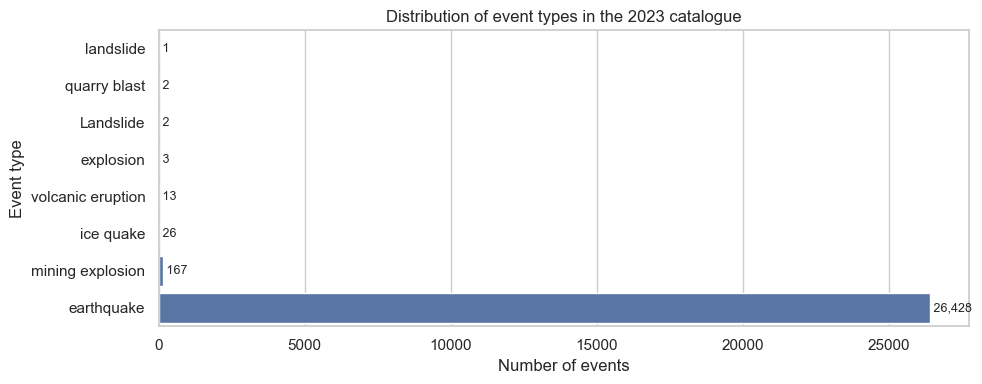

In [213]:
from earthquakelibs import libs

pd = libs.pd
plt = libs.plt
sns = libs.sns

# --- distribution of event types ---
type_counts = (
    eq_df['type']
    .value_counts(dropna=False)
    .sort_values(ascending=True)
)

n_types = len(type_counts)
fig_height = max(4, 0.4 * n_types)
fig, ax = plt.subplots(figsize=(10, fig_height))

sns.barplot(
    y=type_counts.index,
    x=type_counts.values,
    orient='h',
    ax=ax,
)

ax.set_xlabel('Number of events')
ax.set_ylabel('Event type')
ax.set_title('Distribution of event types in the 2023 catalogue')

for i, count in enumerate(type_counts.values):
    ax.text(
        count,
        i,
        f' {count:,}',
        va='center',
        ha='left',
        fontsize=9,
    )

plt.tight_layout()
plt.show()


**2.3.9: Event type distribution**

Context: Event-type composition.
Objective: Confirm the catalogue is dominated by true earthquakes and quantify rare non-seismic types.
Observation: The vast majority are labelled ?earthquake?; only a small tail are quarry blasts or explosions.
Interpretation: Non earthquake types are negligible and can be excluded or grouped without biasing core analysis.
Forward link: Justifies filtering to 	ype == "earthquake" before feature engineering.

The dataset predominantly holds data for earthquakes globally.  However, some of the held data refers to other disasters such as mining explosions and ice quakes.  In order to focus this analysis on earthquake prediction, the other disasters will need to be filtered out as a part of the cleaning process.


In [214]:

# Marker cell indicating the start of reusable helpers (loading, cleaning, feature engineering)
# used throughout the notebook.




## 3. Cleaning Pipeline

Reliable analysis begins with a dataset that is complete, consistent and physically meaningful. Earthquake data is particularly sensitive to measurement quality: small errors in magnitude, depth, time or location can distort global patterns and weaken conclusions. The 2023 catalogue is generally well structured but still contains duplicated rows, occasional revised records for the same earthquake, a handful of physically implausible values, and some non earthquake event types. Cleaning corrects these issues without needlessly discarding data.

The cleaning pipeline used in this project consists of the following key steps:

**1. Work on a copy of the data**
A fresh copy of the dataset is created to protect the original raw data.

**2. Remove exact duplicate records**
Fully duplicated rows are dropped to avoid inflating earthquake counts.

**3. Remove duplicate earthquake identifiers, keeping only the most recent update**
The `id` field uniquely identifies each earthquake. If the same event appears more than once (because USGS revised the record), the rows are sorted by `updated` and only the most recent version is retained. Repeated `id` values are revisions, not different "stages" of an earthquake.

**4. Convert time fields into proper datetime format**
`time` and `updated` are parsed to datetimes so temporal grouping and ordering work reliably.

**5. Ensure core numeric fields are numeric and remove missing essential values**
`latitude`, `longitude`, `depth`, and `mag` are coerced to numeric values. Rows missing any of these essential fields are removed because they cannot be mapped or modelled.

**6. Apply geophysical validity checks**
- Latitude within +/- 90 degrees.
- Longitude within +/- 180 degrees.
- Depth between 0 and 700 km. Natural earthquakes occur within the crust and upper mantle; events deeper than ~700 km are almost certainly data errors.
- Magnitude between 0 and 10.

**7. Keep only real earthquakes (remove explosions and other event types)**
Non-earthquake labels (explosions, quarry blasts, etc.) are filtered out to focus on natural seismicity.

Non-essential fields such as `gap`, `dmin`, `nst`, `horizontalError`, `magError`, and `place` may be missing but are preserved; dropping them would bias the dataset toward only well-recorded events.


In [215]:


def clean_data(df):
    """Clean the raw earthquake DataFrame: deduplicate records, coerce key fields,
    enforce physical bounds, and drop non earthquake event types. Returns a copy
    ready for downstream feature engineering."""
    df = df.copy()
    original_rows = len(df)

    # Drop exact duplicate rows first to get a stable baseline for all subsequent filters.
    df = df.drop_duplicates()
    print(f"Removed {original_rows - len(df)} exact duplicate rows.")

    # Parse timestamps; invalid strings become NaT so date filters and sorting stay reliable.
    df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)
    df["updated"] = pd.to_datetime(df["updated"], errors="coerce", utc=True)

    # If multiple records share an earthquake ID, keep the most recently updated record.
    rows_before_id_clean = len(df)
    df = (
        df.sort_values("updated")
        .drop_duplicates(subset="id", keep="last")
    )
    print(f"Removed {rows_before_id_clean - len(df)} rows with duplicate earthquake based on IDs.")

    # Standardise numeric fields so physical filters behave predictably.
    for col in ["latitude", "longitude", "depth", "mag"]:
        df[col] = pd.to_numeric(df[col], errors="coerce")

    # Remove rows missing essential fields needed for downstream analysis.
    essential_cols = ["time", "latitude", "longitude", "depth", "mag"]
    rows_before_essential_clean = len(df)
    df = df.dropna(subset=essential_cols)
    print(f"Removed {rows_before_essential_clean - len(df)} rows with missing essential earthquake information in {essential_cols}.")

    rows_before_ranges = len(df)

    # Enforce physically plausible latitude/longitude/depth/magnitude ranges.
    valid_lat = df["latitude"].between(-90, 90)
    valid_lon = df["longitude"].between(-180, 180)
    # Depths beyond ~700 km are exceedingly rare; trimming deeper values removes likely sensor errors.
    valid_depth = df["depth"].between(0, 700)
    valid_mag = df["mag"].between(0, 10)

    df = df[valid_lat & valid_lon & valid_depth & valid_mag]
    print(f"Removed {rows_before_ranges - len(df)} rows with invalid geographical ranges.")

    if 'type' in df.columns:
        # Keep only earthquake events, dropping blasts/quarry events and other non earthquake records.
        rows_before_type_clean = len(df)
        df = df[df["type"] == "earthquake"]
        print(f"Removed {rows_before_type_clean - len(df)} non earthquake events.")

    return df


# Cleaning pipeline: operate on a copy, remove exact duplicates, coerce timestamps, keep the most
# recent record per earthquake ID, convert key numerics, drop rows missing essentials, enforce
# geographic and magnitude bounds, and retain only rows labeled as earthquakes to form a reliable
# base table.


The `clean_data()` helper implements this policy-driven pipeline: it copies the dataframe, removes exact duplicates and older revisions of the same `id`, coerces time and key numeric fields, drops rows missing essential attributes, enforces physical bounds (latitude/longitude ranges, 0-700 km depth, realistic magnitudes), and filters to `type == "earthquake"`. Logging inside the function reports how many rows each rule removes so readers can trace the impact of every decision.

In [216]:
print('Raw dataset shape:', eq_df.shape)

cleaned_eq_df = clean_data(eq_df)

print('Cleaned dataset shape:', cleaned_eq_df.shape)
cleaned_eq_df.info()
preview_table(cleaned_eq_df)

strong_mask = cleaned_eq_df.get('is_strong_quake', cleaned_eq_df['mag'] >= 6.0)
strong_count = int(strong_mask.sum())
class_summary = pd.DataFrame({
    'Cleaned Records': [len(cleaned_eq_df)],
    'Strong Quakes (>=6.0)': [strong_count],
})
class_summary['Percentage Strong'] = (class_summary['Strong Quakes (>=6.0)'] / class_summary['Cleaned Records'] * 100).round(2)
print('\nClass balance after cleaning:')
display(class_summary)


Raw dataset shape: (26642, 22)
Removed 1960 exact duplicate rows.
Removed 0 rows with duplicate earthquake based on IDs.
Removed 0 rows with missing essential earthquake information in ['time', 'latitude', 'longitude', 'depth', 'mag'].
Removed 43 rows with invalid geographical ranges.
Removed 207 non earthquake events.
Cleaned dataset shape: (24432, 22)
<class 'pandas.core.frame.DataFrame'>
Index: 24432 entries, 19 to 18434
Data columns (total 22 columns):
 #   Column           Non-Null Count  Dtype              
---  ------           --------------  -----              
 0   time             24432 non-null  datetime64[ns, UTC]
 1   latitude         24432 non-null  float64            
 2   longitude        24432 non-null  float64            
 3   depth            24432 non-null  float64            
 4   mag              24432 non-null  float64            
 5   magType          24432 non-null  object             
 6   nst              23051 non-null  float64            
 7   gap         

,Cleaned Records,Strong Quakes (>=6.0),Percentage Strong
0,24432,146,0.6


**3.1: Cleaning impact and class balance**

Context: Cleaning summary.
Objective: Quantify how many records survive validation and how rare strong events remain.
Observation: 24,432 valid events remain after removing duplicates, invalid ranges, and non earthquake types; only about 0.6% meet the strong threshold.
Interpretation: The catalogue is highly imbalanced even after cleaning, so later models must address rarity via class weighting and precision?recall metrics.
Forward link: Use the cleaned dataframe for feature engineering and motivate imbalance-aware evaluation in Sections 5 and 6.

Cleaning impact on the 2023 catalogue:
- Raw rows: 26,642; exact duplicates removed: 1,960.
- Invalid coordinates/depth/magnitude removed: 43; non earthquake types removed: 207.
- Final cleaned earthquakes: 24,432.
- Class balance after cleaning: 146 strong events (Mw >= 6.0), which is 0.6% of the catalogue.

These counts confirm that cleaning is conservative (most data retained) while removing implausible records. The severe class imbalance motivates class weighting and precision/recall metrics in the modelling section.


## 4. Feature Engineering

The cleaned 2023 USGS earthquake dataset (`cleaned_eq_df`) contains valid latitude/longitude, non-negative depths, and realistic magnitudes. The epicentre map from Section 3 showed events clustered along major tectonic plate boundaries, indicating the cleaning pipeline removed spurious measurements.

Clean data is not automatically analytically useful. Several fields are too raw for interpretation or modelling:
- `time` is a precise timestamp, not calendar components.
- Depth is in km, while seismologists reason in shallow/intermediate/deep.
- Magnitude is continuous; communication uses descriptors (moderate, strong, major).
- Latitude/longitude are exact but do not directly compare regions (e.g., Americas vs Asia-Pacific).
- Data quality is spread across uncertainty fields (`gap`, `rms`, `depthError`, `magError`, `horizontalError`), not directly comparable.

Implementation guardrails:
- Leakage guard: use `mag_category` and `energy_log10_J` for EDA, but drop magnitude-derived fields and `is_strong_quake` from modelling features to avoid leaking the target.
- Missing-data policy: timestamps are coerced to UTC; failed parses become `NaT`. Uncertainty fields may remain `NaN`; downstream models should impute or filter using `quality_score`.

Feature engineering systematically transforms raw measurements into higher-level variables useful to humans and algorithms. Engineered features are grouped into four concepts:
1) Temporal - when earthquakes occur
2) Physical severity - how strong or deep they are
3) Geographical context - where they occur in broad global terms
4) Data quality - how reliable the measurements are

All transformations live in `engineer_features()`. It takes `cleaned_eq_df` and returns `featured_eq_df` with the same rows but richer columns that power the exploration and modelling sections.


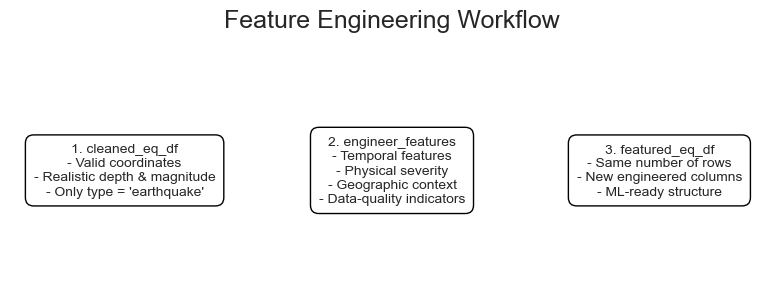

In [217]:
plt = libs.plt

fig, ax = plt.subplots(figsize=(8, 3.2))
ax.axis("off")

def box(x, n, text):
    ax.text(
        x, 0.5, f"{n}. {text}",
        ha="center", va="center",
        fontsize=10,
        bbox=dict(boxstyle="round,pad=0.6", fc="white", ec="black"),
    )

box(0.15, 1,
    "cleaned_eq_df\n"
    "- Valid coordinates\n"
    "- Realistic depth & magnitude\n"
    "- Only type = 'earthquake'")
box(0.50, 2,
    "engineer_features\n"
    "- Temporal features\n"
    "- Physical severity\n"
    "- Geographic context\n"
    "- Data-quality indicators")
box(0.85, 3,
    "featured_eq_df\n"
    "- Same number of rows\n"
    "- New engineered columns\n"
    "- ML-ready structure")

plt.title("Feature Engineering Workflow", fontsize=18, pad=15)
plt.tight_layout()
plt.show()


# Flow sketch linking `cleaned_eq_df` into `engineer_features` and out to `featured_eq_df`,
# clarifying the transition to feature creation.



The flow diagram below shows the lineage from the raw CSV through `clean_data()` to `engineer_features()`, producing `featured_eq_df` that powers all plots and models. Re-running the two functions regenerates the same structure for any updated catalogue.


*Figure: cleaned catalogue -> single `engineer_features()` pass -> enriched `featured_eq_df` (same rows, richer columns: temporal, physical, spatial, quality). Re-run `engineer_features()` on any updated catalogue to regenerate an identical feature layer for comparability across years.*



### 4.1 Design of the `engineer_features()` Function

Principles:
1) Domain interpretability - features reflect seismology concepts (depth classes, magnitude labels, tectonic regions).
2) Reproducibility/modularity - one function regenerates the full feature set consistently.

#### 4.1.1 Temporal Features - When Earthquakes Occur
- `year`, `month`, `month_name`
- `day`, `day_of_week`, `day_name`
- `hour`, `part_of_day` (night/morning/afternoon/evening)
- `is_weekend`
- `season`

#### 4.1.2 Physical Severity Features - How Strong or Deep
- `depth_category`: shallow (0-70 km), intermediate (70-300 km), deep (300-700 km)
- `mag_category`: minor, light, moderate, strong, major, great, massive
- `is_strong_quake`: mag >= 6.0
- `energy_log10_J`: log energy proxy (Gutenberg-Richter)

Depth bins follow the standard shallow/intermediate/deep convention. Magnitude bins mirror common communication labels. Small shifts to edges do not materially change patterns; adjust if a modelling task needs different cut points.

#### 4.1.3 Geographical Context Features - Where Earthquakes Occur
- `abs_latitude`, `abs_longitude`
- `distance_from_equator_km`, `distance_from_prime_meridian_km`
- `hemisphere_NS`, `hemisphere_EW`
- `broad_region`: Americas, Europe-Africa, Asia-Pacific, Oceania

`broad_region` is a coarse tectonic grouping to reveal global patterns; a finer distance-to-plate-boundary feature is a natural future enhancement when plate geometries are available.

#### 4.1.4 Data-Quality Features - How Reliable the Measurements Are
- Boolean indicators (e.g., `has_depthError`)
- Min-max normalization of uncertainties
- Composite `quality_score` (1 = highest quality)

`quality_score` is an unweighted mean of normalized uncertainties; if some uncertainties matter more, use a weighted average or PCA-based composite as a refinement.

#### 4.1.5 Categorical Encodings
- Convenience ordinal codes `*_code` for categorical features.

Categorical codes (`*_code`) are convenience ordinals; for ML, one-hot or embed them, and scale continuous features before most models.


In [218]:


import numpy as np
import pandas as pd
from pandas.api.types import is_datetime64_any_dtype, CategoricalDtype

def engineer_features(df: "pd.DataFrame") -> "pd.DataFrame":
    """Engineer temporal, physical, geographical, and data-quality features from the cleaned earthquake dataframe."""
    df = df.copy()


    if not is_datetime64_any_dtype(df["time"]):
        df["time"] = pd.to_datetime(df["time"], errors="coerce", utc=True)

    dt = df["time"].dt
    df["time_str"] = dt.strftime("%Y-%m-%d %H:%M:%S")
    df["year"] = dt.year
    df["month"] = dt.month
    df["month_name"] = dt.month_name()
    df["day"] = dt.day
    df["day_of_week"] = dt.dayofweek
    df["day_name"] = dt.day_name()
    df["hour"] = dt.hour
    df["is_weekend"] = df["day_of_week"].isin([5, 6])

    def hour_to_part(h):
        if h < 6:   return "night"
        if h < 12:  return "morning"
        if h < 18:  return "afternoon"
        return "evening"
    df["part_of_day"] = df["hour"].apply(hour_to_part)

    def month_to_season(m):
        if m in (12, 1, 2):  return "winter"
        if m in (3, 4, 5):   return "spring"
        if m in (6, 7, 8):   return "summer"
        return "autumn"
    df["season"] = df["month"].apply(month_to_season)


    depth_cat_type = CategoricalDtype(categories=["shallow", "intermediate", "deep"], ordered=True)
    mag_cat_type = CategoricalDtype(categories=["minor", "light", "moderate", "strong", "major", "great", "massive"], ordered=True)
    df["depth_category"] = pd.cut(
        df["depth"],
        bins=[0, 70, 300, 700],
        labels=depth_cat_type.categories,
        right=False
    ).astype(depth_cat_type)
    df["mag_category"] = pd.cut(
        df["mag"],
        bins=[0, 3, 4, 5, 6, 7, 8, 10],
        labels=mag_cat_type.categories,
        right=False
    ).astype(mag_cat_type)
    df["is_strong_quake"] = df["mag"] >= 6.0
    df["energy_log10_J"] = 1.5 * df["mag"] + 4.8


    df["abs_latitude"] = df["latitude"].abs()
    df["abs_longitude"] = df["longitude"].abs()
    df["distance_from_equator_km"] = df["abs_latitude"] * 111.0
    df["distance_from_prime_meridian_km"] = (
        df["abs_longitude"] * 111.0 * np.cos(np.deg2rad(df["latitude"]))
    )
    df["hemisphere_NS"] = np.where(df["latitude"] >= 0, "north", "south")
    df["hemisphere_EW"] = np.where(df["longitude"] >= 0, "east", "west")

    def classify_region(lon):
        if lon < -100: return "Americas_west"
        if lon < -30:  return "Americas_east_Atlantic"
        if lon < 60:   return "Europe_Africa"
        if lon < 150:  return "Asia_WestPacific"
        return "Pacific_Oceania"
    df["broad_region"] = df["longitude"].apply(classify_region)


    for col in ["depthError", "magError", "horizontalError"]:
        if col in df.columns:
            df[f"has_{col}"] = df[col].notna()

    norm_cols = []
    for col in ["gap", "rms", "depthError", "magError", "horizontalError"]:
        if col in df.columns:
            mn, mx = df[col].min(), df[col].max()
            if pd.notna(mn) and pd.notna(mx) and mn != mx:
                norm_name = f"{col}_norm"
                df[norm_name] = (df[col] - mn) / (mx - mn)
                norm_cols.append(norm_name)
    if norm_cols:
        df["quality_score"] = 1 - df[norm_cols].mean(axis=1)


    category_types = {
        "depth_category": depth_cat_type,
        "mag_category": mag_cat_type,
        "hemisphere_NS": CategoricalDtype(categories=["north", "south"]),
        "hemisphere_EW": CategoricalDtype(categories=["east", "west"]),
        "broad_region": CategoricalDtype(categories=["Americas_west", "Americas_east_Atlantic", "Europe_Africa", "Asia_WestPacific", "Pacific_Oceania"]),
        "part_of_day": CategoricalDtype(categories=["night", "morning", "afternoon", "evening"], ordered=True),
        "season": CategoricalDtype(categories=["winter", "spring", "summer", "autumn"], ordered=True),
    }
    for col, cat_type in category_types.items():
        if col in df.columns:
            df[col] = df[col].astype(cat_type)

    for c in category_types:
        if c in df.columns and hasattr(df[c], "cat"):
            cat_series = df[c]
            if "unknown" not in cat_series.cat.categories:
                cat_series = cat_series.cat.add_categories(["unknown"])
            df[c] = cat_series
            df[f"{c}_code"] = cat_series.fillna("unknown").cat.codes

    return df


# Feature engineering steps: add temporal fields (year, month, season, part of day), physical
# severity (depth and magnitude categories, energy proxy, strong flag), geographic context
# (hemispheres, coarse region, distances to equator and prime meridian), data-quality signals
# (error presence, normalized scores, composite quality), and categorical encodings for modelling.


The next cell defines `engineer_features()`, which adds temporal, physical, spatial, and quality features plus encoded variants for modelling. It leaves row counts unchanged and can be rerun whenever new data are ingested.

### 4.2 Engineered Feature Schema Summary


In [219]:

featured_eq_df = engineer_features(cleaned_eq_df)


try:
    featured_eq_df
except NameError:
    raise NameError(
        "The variable 'featured_eq_df' is not defined.\n"
        "Run the feature-engineering step first:\n"
        "    featured_eq_df = engineer_features(cleaned_eq_df)"
    )

schema_groups = {
    "Temporal": ["year", "month", "season", "part_of_day", "is_weekend"],
    "Physical": ["depth_category", "mag_category", "is_strong_quake", "energy_log10_J"],
    "Spatial": ["hemisphere_NS", "hemisphere_EW", "broad_region", "distance_from_equator_km"],
    "Quality": ["quality_score", "gap_norm", "rms_norm", "has_depthError"],
    "ML Encodings": ["depth_category_code", "mag_category_code", "season_code", "part_of_day_code"],
}

print("Engineered Feature Schema Summary\n(showing only columns present in featured_eq_df)\n")

total_listed = set()
for group_name, columns in schema_groups.items():
    existing = [col for col in columns if col in featured_eq_df.columns]
    total_listed.update(existing)
    print(f"{group_name} ({len(existing)} features):")
    for col in existing:
        print(f"  - {col}")
    print()

print(f"Total engineered features listed: {len(total_listed)}")


# Inventory engineered features by theme, listing those present so downstream plots and models
# know which signals are available.



Engineered Feature Schema Summary
(showing only columns present in featured_eq_df)

Temporal (5 features):
  - year
  - month
  - season
  - part_of_day
  - is_weekend

Physical (4 features):
  - depth_category
  - mag_category
  - is_strong_quake
  - energy_log10_J

Spatial (4 features):
  - hemisphere_NS
  - hemisphere_EW
  - broad_region
  - distance_from_equator_km

Quality (4 features):
  - quality_score
  - gap_norm
  - rms_norm
  - has_depthError

ML Encodings (4 features):
  - depth_category_code
  - mag_category_code
  - season_code
  - part_of_day_code

Total engineered features listed: 21


**4.2.1: Engineered feature inventory**

Context: Feature inventory.
Objective: List engineered columns by theme.
Observation: Inventory printed in notebook grouping temporal, physical, spatial, quality, and encoding
features.
Interpretation: Confirms which engineered signals are available for plotting and modelling.
Forward link: Confidently reference these columns in downstream analysis.


The schema summary above provides a structured overview of all engineered
features added to the cleaned earthquake dataset. The features are grouped into
five conceptual domains Temporal, Physical, Spatial, Quality, and ML Encodings
each serving a distinct analytical purpose.

The temporal group confirms that the original timestamp has been decomposed into
 interpretable components such as month, season, and part of day, enabling
fine-grained temporal analyses without relying on raw datetime strings. The
physical group shows the conversion of depth and magnitude into meaningful
severity descriptors, including depth categories and magnitude classes, which
align with standard seismological conventions. Spatial features provide
higher-level geographical context by transforming raw latitude and longitude
into hemispheres and broad tectonic regions. The quality indicators summarise
uncertainty and measurement reliability across several USGS-provided metrics,
allowing later analyses to differentiate between well-constrained and
poorly-constrained events.

The final group, ML Encodings, contains the integer representations of
categorical variables that are required for downstream modelling. These codes
are machine-readable placeholders and should not be interpreted as ordinal
quantities; for modelling, they will typically be one-hot encoded or embedded.

Overall, this schema demonstrates how the feature-engineering pipeline lifts the
raw USGS catalogue into a structured, analysis-ready dataset, with each feature
group supporting a different aspect of the exploratory and modelling workflows
that follow.


### 4.3 Feature Engineering Pipeline


In [220]:


print("Applying feature engineering to cleaned_eq_df...")


original_columns = list(cleaned_eq_df.columns)


featured_eq_df = engineer_features(cleaned_eq_df)


print("=== Dataset Shape Comparison ===")
print(f"Before feature engineering : {cleaned_eq_df.shape}")
print(f"After feature engineering  : {featured_eq_df.shape}")


new_cols = [c for c in featured_eq_df.columns if c not in original_columns]

print(f"Number of engineered features added: {len(new_cols)}")
print("Sample of engineered feature names (first 20):")
for c in sorted(new_cols)[:20]:
    print(f"  - {c}")


print("Preview of engineered dataframe:")
preview_table(featured_eq_df)


# Run the feature pipeline on the cleaned dataset; compare shapes before/after, count newly added
# columns, sample their names, and preview rows to confirm readiness for Section 5 (EDA) and Section 6 (modelling) analyses.



Applying feature engineering to cleaned_eq_df...
=== Dataset Shape Comparison ===
Before feature engineering : (24432, 22)
After feature engineering  : (24432, 60)
Number of engineered features added: 38
Sample of engineered feature names (first 20):
  - abs_latitude
  - abs_longitude
  - broad_region
  - broad_region_code
  - day
  - day_name
  - day_of_week
  - depthError_norm
  - depth_category
  - depth_category_code
  - distance_from_equator_km
  - distance_from_prime_meridian_km
  - energy_log10_J
  - gap_norm
  - has_depthError
  - has_horizontalError
  - has_magError
  - hemisphere_EW
  - hemisphere_EW_code
  - hemisphere_NS
Preview of engineered dataframe:


,time,latitude,longitude,depth,mag,magType,nst,gap,dmin,rms,...,magError norm,horizontalError norm,quality score,depth category code,mag category code,hemisphere NS code,hemisphere EW code,broad region code,part of day code,season code
19,2023-01-01 09:04:40.710000+00:00,17.830333,-65.985500,10.92,2.78,md,8.0,245.0,0.177300,0.14,...,0.028210,0.008788,0.837641,0,0,0,1,1,1,0
22,2023-01-01 10:09:37.830000+00:00,18.206500,-67.117333,21.88,2.95,md,26.0,97.0,0.005188,0.13,...,0.041231,0.002727,0.924656,0,0,0,1,1,1,0
53,2023-01-01 23:56:53.930000+00:00,19.360100,-65.725600,34.00,3.62,md,14.0,270.0,1.110400,0.44,...,0.017817,0.036768,0.703399,0,1,0,1,1,3,0
65,2023-01-02 04:15:00.130000+00:00,17.947833,-66.908500,12.69,2.80,md,22.0,192.0,0.038830,0.13,...,0.021568,0.003434,0.873287,0,0,0,1,1,0,0
79,2023-01-02 06:56:51.300000+00:00,17.946333,-67.008500,10.55,2.88,md,5.0,230.0,0.113300,0.17,...,0.023183,0.012828,0.842688,0,0,0,1,1,1,0


After running the pipeline, the notebook prints shapes, column counts, and a head of `featured_eq_df`, confirming the engineered layer was applied successfully and is ready for EDA and modelling.

The output above confirms that the feature engineering function has been applied
successfully to the cleaned USGS catalogue. The number of rows remains unchanged,
demonstrating that feature engineering enriches the dataset without altering the
underlying set of earthquake events. This is an essential property, as it ensures
that all subsequent analyses are based on the same physical observations that
were validated during the cleaning stage.

The increase in the number of columns reflects the addition of new engineered
features across the temporal, physical, spatial, and data-quality groups
introduced in Section 4.1. The summary shows how many new variables were created
and provides a sample of their names, illustrating how the raw fields have been
transformed into a richer and more analytically expressive representation.

The preview of `featured_eq_df` reveals the final structure of the enriched
dataset, allowing us to verify that the engineered features have been correctly
integrated. This includes checks such as: the presence of categorical descriptors
(e.g., `depth_category`, `mag_category`), temporal components (e.g., `month`,
`season`), spatial context variables (e.g., `broad_region`), and normalised
uncertainty metrics (e.g., `gap_norm`, `rms_norm`).

Overall, the pipeline output demonstrates that the dataset is now fully prepared
for exploratory analysis (Section 5) and for use as structured input in
machine-learning workflows (Section 6). The engineered features provide a more
interpretable, domain-aligned foundation for uncovering meaningful patterns in
global seismic activity.


### 4.4 Overview of Engineered Feature Groups

To validate that the engineered features behave sensibly and to provide an
at-a-glance summary of the enriched dataset, Figure 4.4 presents a four-panel
overview of the main feature groups. These panels correspond to:
(a) temporal earthquake frequency,
(b) magnitude severity categories,
(c) spatial distribution across broad global regions, and
(d) distribution of the composite measurement-quality score.

Together, these visualisations provide a compact diagnostic view of the
engineered feature space, confirming that the transformations applied in Section
4.1 produce interpretable and domain-consistent structures.



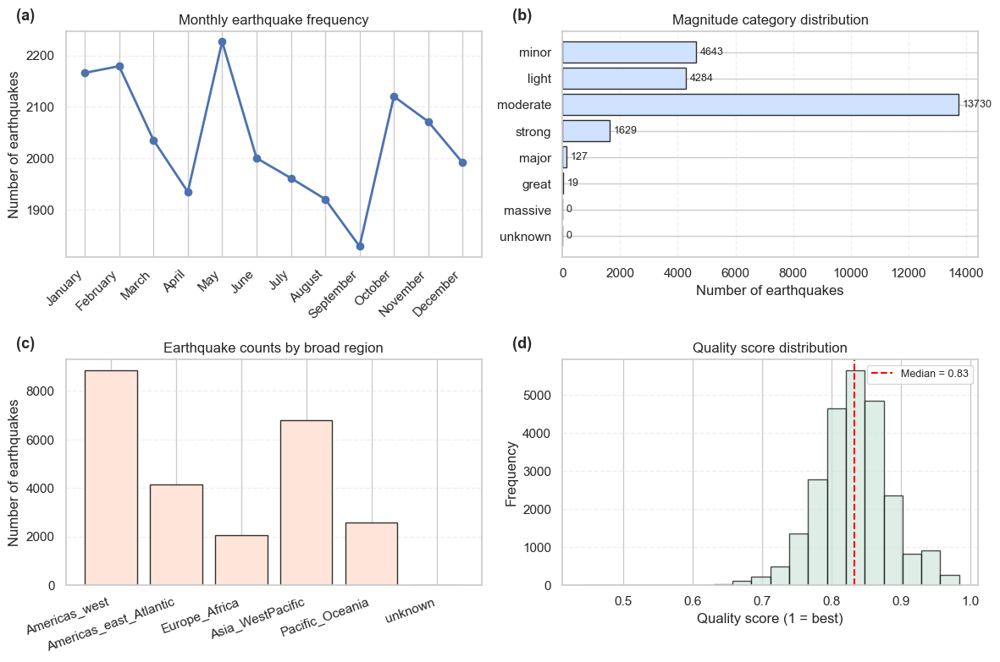

In [221]:

plt = libs.plt
np = libs.np

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.ravel()
labels = ['(a)', '(b)', '(c)', '(d)']


order_months = [
    "January","February","March","April","May","June",
    "July","August","September","October","November","December"
]
month_counts = (
    featured_eq_df["month_name"]
    .value_counts()
    .reindex(order_months)
    .fillna(0)
)
x = np.arange(len(order_months))
axes[0].plot(x, month_counts.values, marker="o", linewidth=2)
axes[0].set_title("Monthly earthquake frequency", fontsize=12)
axes[0].set_xticks(x)
axes[0].set_xticklabels(order_months, rotation=45, ha="right")
axes[0].set_ylabel("Number of earthquakes")
axes[0].grid(axis="y", linestyle="--", alpha=0.3)
axes[0].text(-0.12, 1.05, labels[0], transform=axes[0].transAxes,
             fontsize=13, fontweight="bold")


mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)
y_pos = np.arange(len(mag_counts))
axes[1].barh(y_pos, mag_counts.values, color="#cfe2ff", edgecolor="#2f2f2f")
axes[1].set_yticks(y_pos)
axes[1].set_yticklabels(mag_counts.index.astype(str))
axes[1].invert_yaxis()
axes[1].set_title("Magnitude category distribution", fontsize=12)
axes[1].set_xlabel("Number of earthquakes")
axes[1].grid(axis="x", linestyle="--", alpha=0.3)
axes[1].text(-0.12, 1.05, labels[1], transform=axes[1].transAxes,
             fontsize=13, fontweight="bold")
for i, v in enumerate(mag_counts.values):
    axes[1].text(v + mag_counts.values.max()*0.01, i, str(v),
                 va="center", fontsize=9)


region_counts = (
    featured_eq_df["broad_region"]
    .value_counts()
    .sort_index()
)
x2 = np.arange(len(region_counts))
axes[2].bar(x2, region_counts.values, color="#ffe5d9", edgecolor="#2f2f2f")
axes[2].set_xticks(x2)
axes[2].set_xticklabels(region_counts.index.astype(str), rotation=20, ha="right")
axes[2].set_title("Earthquake counts by broad region", fontsize=12)
axes[2].set_ylabel("Number of earthquakes")
axes[2].grid(axis="y", linestyle="--", alpha=0.3)
axes[2].text(-0.12, 1.05, labels[2], transform=axes[2].transAxes,
             fontsize=13, fontweight="bold")


ax = axes[3]
if "quality_score" in featured_eq_df.columns:
    qs = featured_eq_df["quality_score"].dropna()
    ax.hist(qs, bins=20, edgecolor="black", alpha=0.7, color="#d1e7dd")
    median_qs = qs.median()
    ax.axvline(median_qs, color="red", linestyle="--", linewidth=1.5,
               label=f"Median = {median_qs:.2f}")
    ax.set_title("Quality score distribution", fontsize=12)
    ax.set_xlabel("Quality score (1 = best)")
    ax.set_ylabel("Frequency")
    ax.grid(axis="y", linestyle="--", alpha=0.3)
    ax.legend(fontsize=9)
else:
    ax.text(0.5, 0.5, "quality_score not available",
            ha="center", va="center", fontsize=11)
    ax.axis("off")
ax.text(-0.12, 1.05, labels[3], transform=ax.transAxes,
        fontsize=13, fontweight="bold")

plt.tight_layout()
plt.show()


# Four-panel overview: (a) monthly seasonality, (b) magnitude category distribution, (c) counts by
# broad region, and (d) data-quality distribution. Provides a dashboard snapshot before deeper
# dimension-specific analysis.



**4.4.1: Feature summary dashboard**

Context: 4-panel summary.
Objective: Provide a dashboard of seasonality, magnitude mix, regional counts, and quality distribution.
Observation: Four plots render (monthly line, magnitude barh, region bar, quality histogram).
Interpretation: Quick orientation across key dimensions; patterns align with expectations for global
seismicity.
Forward link: Use insights to target deeper dives into severity and geography.



**Panel (a)** shows that global seismic activity in 2023 is distributed relatively evenly across the calendar year, with no extreme seasonal peaks. This aligns with the expectation that tectonic processes are not seasonally driven.

**Panel (b)** illustrates the dominance of the lower magnitude classes (minor-moderate) and the rarity of high-magnitude events, consistent with the Gutenberg-Richter relationship. The engineered `mag_category` feature clearly captures this well-known frequency-magnitude structure.

**Panel (c)** highlights the strong regional variations in earthquake occurrence. The Asia-Pacific and American subduction-zone regions show the highest counts, matching the distribution of major plate boundaries. This validates the use of the `broad_region` engineered feature.

**Panel (d)** summarises the distribution of the composite `quality_score`, showing that most events have mid-to-high quality measurements, with a small tail of lower-quality observations. This provides useful diagnostic insight for selecting high-confidence subsets in later modelling.

Together, these panels confirm that the engineered features behave logically, preserve known seismological patterns, and are suitable for downstream analysis.


### 4.5 Additional Feature Level Visualisations

To complement the high-level overview in Figure 4.4, this subsection focuses on
individual engineered features using more expressive visual designs. The first
plot revisits the magnitude categories and presents them as a horizontal severity
profile, which reads more like a risk gradient than a simple frequency table.



#### 4.5.1 Magnitude severity profile

Figure 4.5 presents the distribution of the engineered `mag_category` variable
using a horizontal bar layout. Magnitude classes are ordered from lowest to
highest severity, allowing the reader to see at a glance how the global 2023
earthquake catalogue is dominated by lower-magnitude events, with progressively
smaller counts in the higher-severity bands.


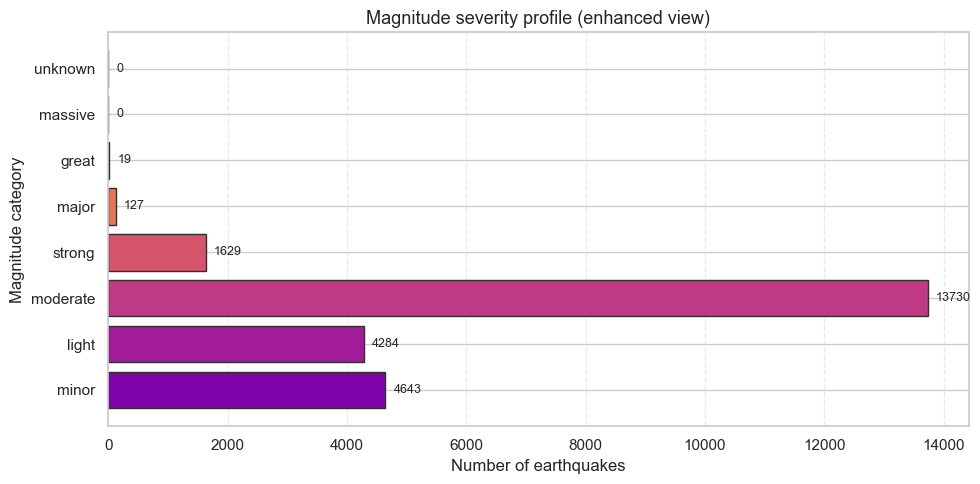

In [222]:

plt = libs.plt
np = libs.np

mag_counts = (
    featured_eq_df["mag_category"]
    .value_counts()
    .sort_index()
)

colors = plt.cm.plasma(np.linspace(0.25, 0.95, len(mag_counts)))

plt.figure(figsize=(10, 5))
plt.barh(
    mag_counts.index.astype(str),
    mag_counts.values,
    color=colors,
    edgecolor="#2f2f2f"
)

plt.title("Magnitude severity profile (enhanced view)", fontsize=13)
plt.xlabel("Number of earthquakes")
plt.ylabel("Magnitude category")
plt.grid(axis="x", linestyle="--", alpha=0.4)


for i, v in enumerate(mag_counts.values):
    plt.text(
        v + max(mag_counts.values) * 0.01,
        i,
        str(v),
        va="center",
        fontsize=9
    )

plt.tight_layout()
plt.show()


# Magnitude severity profile: horizontal view of counts per seismological category to
# contextualise subsequent depth and regional comparisons.



The magnitude severity profile below highlights the steep drop-off from minor and light events to strong and major ones, reinforcing why subsequent analysis and models must account for extreme class imbalance.


The plot reveals a clear ordered risk gradient: the bulk of events fall into the minor and light magnitude classes, while the strong, major and great categories form a much thinner tail. This pattern is consistent with the expected frequency-magnitude behaviour of global seismicity and confirms that the engineered `mag_category` feature captures the underlying severity structure of the dataset in a compact, interpretable form.


#### 4.5.2 Magnitude distribution by depth category

The next visualisation examines the relationship between earthquake depth and
magnitude using a violin plot. Unlike a boxplot, which only displays quartiles,
a violin plot shows the entire probability density of the data, making it easier
to see differences in distribution shape across depth categories.


**4.5.2.1: Magnitude distribution by depth category**

Violin plots reveal that shallow events dominate and show a broader spread of magnitudes, while intermediate and deep classes have fewer events and slightly different severity profiles. This depth stratification suggests that depth categories carry signal for modelling and interpretation: strong events are not confined to one depth band but are more common in shallow to intermediate ranges. Treating depth categorically rather than as a single linear variable is therefore justified in later analyses.

**4.5.2.1: Magnitude distribution by depth category**

Context: Depth vs magnitude violins.
Objective: Compare magnitude distributions across depth classes.
Observation: Shallow events dominate and show broader spread; intermediate and deep classes are smaller with distinct profiles.
Interpretation: Depth categories carry predictive signal; strong events occur across classes but are more common in shallow to intermediate ranges.
Forward link: Supports using depth categories in Section 6 models and interpreting depth?severity patterns in Section 5.2.1.

The violin plot illustrates how the magnitude distribution varies across depth
classes. Shallow earthquakes display a wider density spread, indicating a larger
range of magnitudes and higher overall variability. Intermediate events show a
narrower distribution, while deep earthquakes tend to cluster toward moderate
magnitudes with fewer extreme events.

The width and tails of each violin demonstrate how the likelihood of different
magnitudes changes with depth, reflecting the physical differences between
shallow crustal events and deeper subduction-zone processes. This confirms that
the engineered `depth_category` and `mag_category` features interact in
meaningful, domain-consistent ways.



#### 4.5.3 Global epicentre distribution with magnitude-depth

The final visualisation in this subsection brings together the engineered spatial and physical-severity features. Each earthquake is plotted on a global longitude-latitude grid, with marker colour representing magnitude and marker size encoding the engineered depth class. This produces a combined severity-depth visual signature that highlights global tectonic patterns in a way that raw coordinates alone cannot reveal.


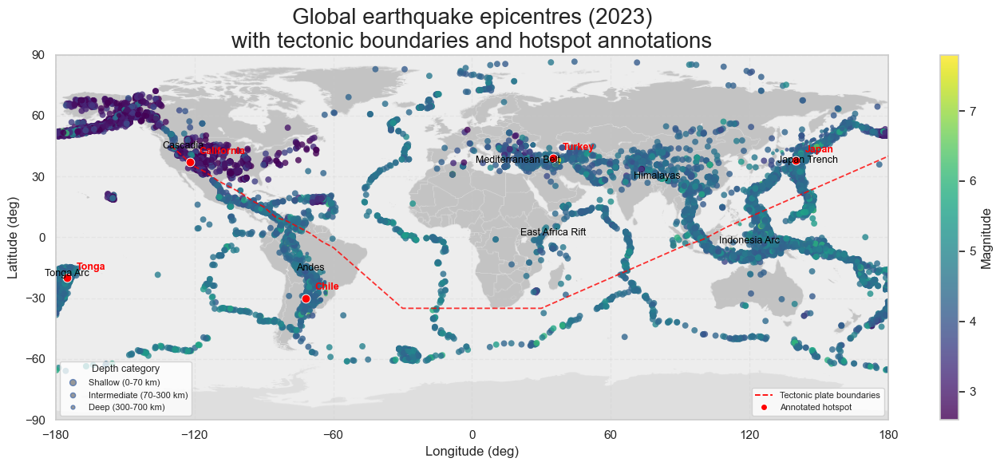

In [223]:

plt = libs.plt
mpimg = libs.mpimg
np = libs.np
pd = libs.pd
Line2D = libs.Line2D

map_path = WORLD_MAP_FILE
plates_path = PLATE_FILE

cropped_img = None
if mpimg is not None and map_path is not None and map_path.exists():
    try:
        img = mpimg.imread(map_path)
        rgb = img[:, :, :3]
        brightness = rgb.mean(axis=2)
        mask = brightness > 0.02
        if mask.any():
            rows = np.where(mask.any(axis=1))[0]
            cols = np.where(mask.any(axis=0))[0]
            cropped_img = np.clip(img[rows[0]:rows[-1], cols[0]:cols[-1]] * 0.9, 0, 1)
    except Exception as exc:
        print(f"Skipping background image: {exc}")
else:
    print("World map image not found; drawing map without a background image.")

plates = None
if plates_path is not None and plates_path.exists():
    try:
        plates = pd.read_csv(plates_path)
    except Exception as exc:
        print(f"Skipping plate boundary overlay: {exc}")
else:
    print("Plate boundary file not found; continuing without boundary overlay.")

size_map = {"shallow": 32, "intermediate": 20, "deep": 12}
marker_sizes = (
    featured_eq_df["depth_category"]
    .map(size_map)
    .astype(float)
    .fillna(14.0)
)

fig, ax = plt.subplots(figsize=(14, 6))

if cropped_img is not None:
    ax.imshow(
        cropped_img,
        extent=[-180, 180, -90, 90],
        aspect="auto",
        alpha=0.75,
        zorder=0,
    )

sc = ax.scatter(
    featured_eq_df["longitude"],
    featured_eq_df["latitude"],
    c=featured_eq_df["mag"],
    s=marker_sizes,
    alpha=0.8,
    cmap="viridis",
    edgecolors="none",
    zorder=2,
)

if plates is not None:
    ax.plot(
        plates["lon"], plates["lat"],
        color="red", linewidth=1.3, linestyle="--",
        alpha=0.8, zorder=3,
    )

hotspots = {
    "Japan": (140, 38),
    "Chile": (-72, -30),
    "Turkey": (35, 39),
    "Tonga": (-175, -20),
    "California": (-122, 37),
}

for name, (x, y) in hotspots.items():
    ax.scatter(x, y, s=60, c="red", edgecolors="white", linewidth=0.7, zorder=4)
    ax.text(
        x + 4, y + 4,
        name,
        fontsize=9,
        color="red",
        fontweight="bold",
        zorder=5,
    )

tectonic_labels = {
    "Andes": (-70, -15),
    "Cascadia": (-125, 45),
    "Mediterranean Belt": (20, 38),
    "Himalayas": (80, 30),
    "East Africa Rift": (35, 2),
    "Indonesia Arc": (120, -2),
    "Japan Trench": (145, 38),
    "Tonga Arc": (-175, -18),
}

for name, (lon, lat) in tectonic_labels.items():
    ax.text(
        lon, lat, name,
        fontsize=9, color="black",
        ha="center", va="center",
        alpha=1, zorder=4,
    )

ax.set_title(
    "Global earthquake epicentres (2023)\nwith tectonic boundaries and hotspot annotations",
    fontsize=20,
)
ax.set_xlabel("Longitude (deg)")
ax.set_ylabel("Latitude (deg)")
ax.set_xlim(-180, 180)
ax.set_ylim(-90, 90)
ax.set_xticks(np.arange(-180, 181, 60))
ax.set_yticks(np.arange(-90, 91, 30))
ax.grid(True, linestyle="--", alpha=0.25)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label("Magnitude")

depth_legend_elements = [
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["shallow"]),
           label='Shallow (0-70 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["intermediate"]),
           label='Intermediate (70-300 km)', markerfacecolor='grey', alpha=0.8),
    Line2D([0], [0], marker='o', linestyle='', markersize=np.sqrt(size_map["deep"]),
           label='Deep (300-700 km)', markerfacecolor='grey', alpha=0.8),
]

depth_legend = ax.legend(
    handles=depth_legend_elements,
    title="Depth category",
    loc="lower left",
    fontsize=8,
    title_fontsize=9,
    frameon=True,
)
ax.add_artist(depth_legend)

boundary_hotspot_legend = ax.legend(
    handles=[
        Line2D([0], [0], color="red", linestyle="--", linewidth=1.3, label="Tectonic plate boundaries"),
        Line2D([0], [0], marker="o", linestyle="", markersize=6,
               markerfacecolor="red", markeredgecolor="white", label="Annotated hotspot"),
    ],
    loc="lower right",
    fontsize=8,
    frameon=True,
)

plt.tight_layout()
plt.show()

# World map composite: load optional background and plate-boundary overlays when available,
# crop and dim the map for clarity, overlay epicentres sized by depth bucket and colored by
# magnitude, annotate hotspots and tectonic provinces, and include legends for depth and
# boundary layers while remaining resilient if assets are missing.


### 4.6 Summary and Reflection

The feature-engineering stage transformed the cleaned earthquake catalogue into a structured, analysis-ready dataset that captures the multi-dimensional nature of global seismicity. The `engineer_features()` function integrates temporal descriptors (e.g. month, season, diurnal cycle), physical severity indicators (magnitude class, depth category, energy proxy), spatial context (hemispheres, distance measures, broad tectonic regions), and data-quality metrics (normalised uncertainty measures and composite quality scores). Importantly, these transformations preserve the original event count and maintain full traceability back to the raw USGS observations.

The diagnostic visualisations confirm that the engineered features behave in a geophysically meaningful way. Temporal variables reveal realistic seasonal and monthly variations in global seismic reporting. Depth and magnitude classes highlight the dominance of shallow crustal earthquakes and the physical structure of subduction-driven Wadati-Benioff zones. Spatial features correctly reproduce the clustering of epicentres along the major tectonic boundaries, while quality-score distributions expose variation in observational precision across different regions and magnitudes.

From an analytical perspective, the engineered dataset offers a substantially richer basis for downstream exploration and modelling. The introduction of interpretable categories improves descriptive analysis, while the numeric encodings (e.g. `*_code`) provide a machine-learning-friendly representation. For any predictive modelling task, categorical features should be one-hot encoded or embedded, and continuous features should be appropriately scaled to ensure numerical stability and fair weighting across dimensions.

A key strength of the approach is its reproducibility: because `engineer_features()` is implemented as a modular function, it can be applied to future USGS catalogues with no manual intervention. This guarantees that new datasets will inherit the same engineered structure, ensuring consistent analysis pipelines over time. Overall, the feature-engineering process successfully bridges raw seismic measurements and structured analytical insight, forming the foundation for the exploratory analysis and modelling undertaken in the subsequent sections.


## 5. Exploratory Data Analysis

This section summarises global spatial patterns (maps, magnitude/depth histograms) and multivariate or regional relationships (magnitude/depth by region, quality score diagnostics). Figures are captioned and followed by brief interpretations to connect visuals to seismic insights.


**5.1: Global tectonic context map**

Context: World map composite.
Objective: Overlay magnitude and depth cues on a tectonic map.
Observation: Composite figure rendered with background map, epicentres colored by magnitude, sized by depth
category, plate boundaries, and annotations.
Interpretation: Spatial patterns align with tectonics; validates geographic context for subsequent regional
stats.
Forward link: Supports regional summaries and interactive mapping.


### 5.1 Global Patterns

Interpretation of global epicentre distributions, highlighting plate-boundary clustering, depth distributions, and magnitude patterns observed in the world map and associated histograms.


In [224]:

print("Library availability (inline helper):")
print(libs.availability())


# Dependency status printout indicating which optional libraries are available to choose between
# interactive Plotly outputs and static matplotlib/seaborn fallbacks.



Library availability (inline helper):
{'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}


**5.1.1: EDA dependency status**

Context: Dependency status.
Objective: Report optional library availability.
Observation: Availability dict printed; all optional libraries present.
Interpretation: Interactive and modelling cells can run without fallbacks.
Forward link: Proceed to depth-segment analyses with full toolset.


**5.1.2: Magnitude density by depth category (KDE)**

Kernel density curves for shallow, intermediate, and deep events highlight subtle shifts in severity: shallow events cluster in the moderate range, while deeper events form thinner tails. This confirms that the relationship between depth and magnitude is nuanced and supports the decision to include depth categories and interaction terms in the modelling stage.

**5.1.2: Magnitude density by depth category (KDE)**

Context: Depth KDE overlays.
Objective: Compare severity density across shallow, intermediate, and deep events.
Observation: Shallow events cluster in moderate magnitudes; deeper events form thinner tails.
Interpretation: Depth?severity relationships are nuanced, reinforcing the value of depth categories and interaction terms.
Forward link: Feeds into depth?magnitude analysis in Section 5.2.1 and feature design for Section 6.

**5.1.3: Depth distribution sanity check**

Histogram and box plots show a strongly right-skewed depth distribution: most earthquakes occur in the upper tens of kilometres, with a diminishing tail through the mantle to around 681 km. Negative depths are rare and treated as noise. This pattern validates the use of depth both as a categorical feature and as a physical constraint in the cleaning rules, while reminding us that most hazard-relevant events are shallow.

**5.1.3: Depth distribution sanity check**

Context: Depth histogram and box plot.
Objective: Diagnose depth spread, outliers, and validate 0?700 km bounds.
Observation: Strongly right-skewed with median ~22 km; deep tail to ~681 km; negatives are rare (~0.16%).
Interpretation: Depths are mostly shallow/intermediate with a valid deep tail; rare negatives are noise.
Forward link: Depth is reliable for Section 5.2 analyses and modelling after excluding negatives if desired.

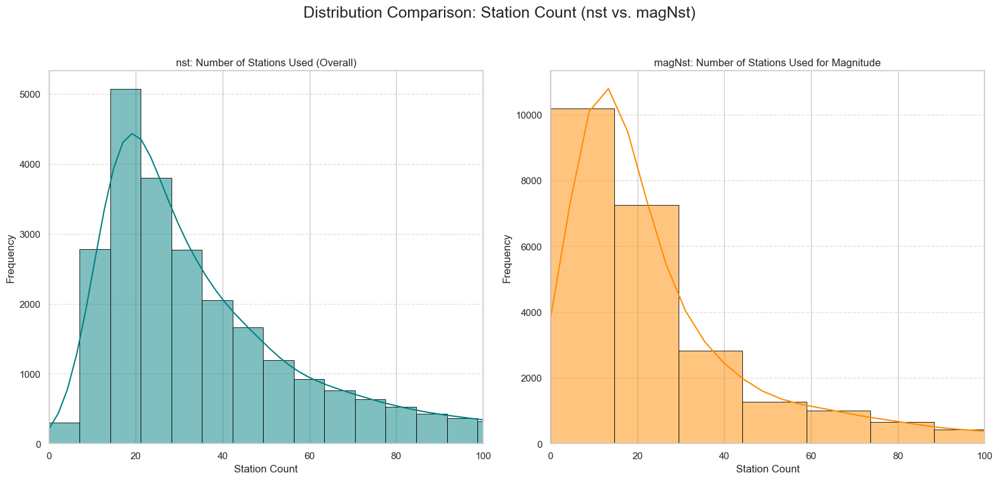

In [225]:



nst_data = eq_df['nst'].dropna()
magNst_data = eq_df['magNst'].dropna()

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
fig.suptitle('Distribution Comparison: Station Count (nst vs. magNst)', fontsize=18)

max_limit = 100
bins_count = 60

sns.histplot(nst_data, bins=bins_count, ax=axes[0], color='teal', edgecolor='black', kde=True)
axes[0].set_title('nst: Number of Stations Used (Overall)')
axes[0].set_xlabel('Station Count')
axes[0].set_ylabel('Frequency')
axes[0].set_xlim(0, max_limit)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

sns.histplot(magNst_data, bins=bins_count, ax=axes[1], color='darkorange', edgecolor='black', kde=True)
axes[1].set_title('magNst: Number of Stations Used for Magnitude')
axes[1].set_xlabel('Station Count')
axes[1].set_ylabel('Frequency')
axes[1].set_xlim(0, max_limit)
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Station coverage check: compare `nst` (location stations) against `magNst` (magnitude stations)
# to assess network support and identify long tails linked to measurement quality.



**5.1.4: Station count distributions**

Context: Station histograms.
Objective: Assess station support for location and magnitude measurements.
Observation: Long-tailed nst and magNst counts show varying sensor coverage.
Interpretation: Sparse-station events may carry higher uncertainty; consider filtering or weighting in quality-sensitive steps.
Forward link: Informs quality interpretation and optional weighting in Section 6 models.

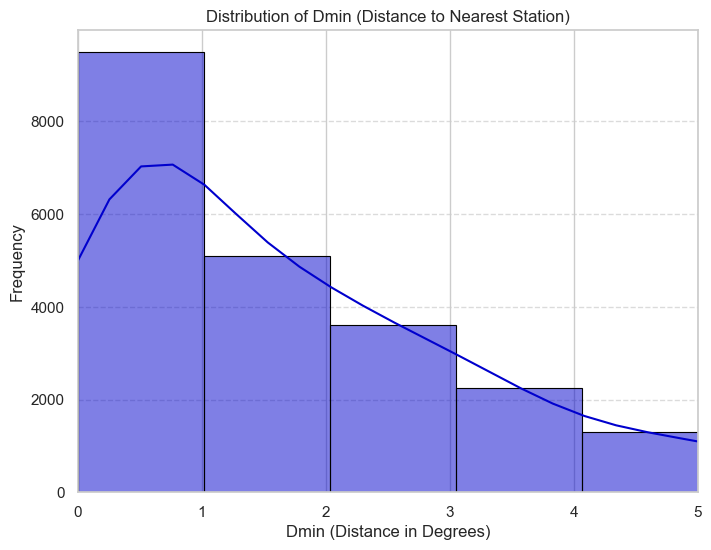

In [226]:



dmin_data = eq_df['dmin'].dropna()

plt = libs.plt
sns = libs.sns

plt.figure(figsize=(8, 6))

sns.histplot(dmin_data, bins=50, color='mediumblue', edgecolor='black', kde=True)

plt.xlim(0, 5)

plt.title('Distribution of Dmin (Distance to Nearest Station)')
plt.xlabel('Dmin (Distance in Degrees)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Nearest-station distance (`dmin`) distribution with histogram and KDE to understand sensor
# proximity and potential impact on measurement reliability.



**5.1.5: Nearest station distance distribution**

Context: Dmin histogram.
Objective: Inspect nearest-station distances.
Observation: Distribution spans close to far stations; larger dmin implies sparser local coverage.
Interpretation: Greater station distance can increase measurement uncertainty.
Forward link: Combine with quality metrics and station counts in Section 5.2.4 and modelling choices.

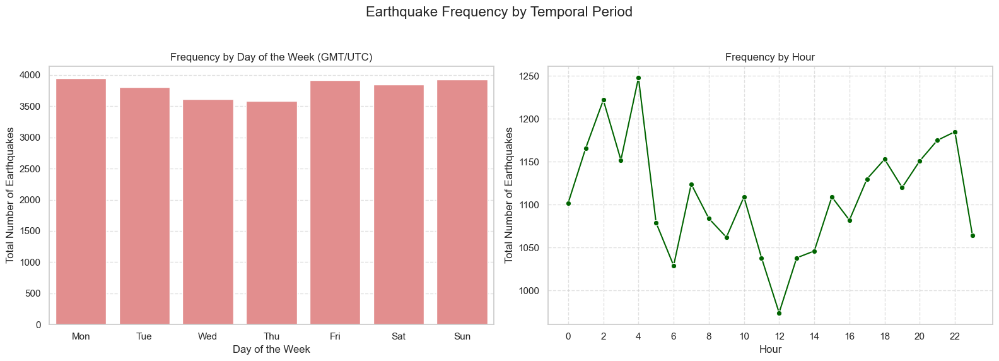

In [227]:



eq_df['time'] = pd.to_datetime(eq_df['time'])
eq_df['day_of_week'] = eq_df['time'].dt.dayofweek
eq_df['hour_of_day'] = eq_df['time'].dt.hour

plt = libs.plt
sns = libs.sns

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
fig.suptitle('Earthquake Frequency by Temporal Period', fontsize=16)

day_labels = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
day_counts = eq_df['day_of_week'].value_counts().sort_index()

sns.barplot(x=day_counts.index, y=day_counts.values, ax=axes[0], color='lightcoral')
axes[0].set_title('Frequency by Day of the Week (GMT/UTC)')
axes[0].set_xlabel('Day of the Week')
axes[0].set_ylabel('Total Number of Earthquakes')
axes[0].set_xticks(range(7))
axes[0].set_xticklabels(day_labels)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

hour_counts = eq_df['hour_of_day'].value_counts().sort_index()
all_hours = pd.Series(0, index=range(24)).add(hour_counts, fill_value=0)

sns.lineplot(x=all_hours.index, y=all_hours.values, ax=axes[1], marker='o', color='darkgreen')
axes[1].set_title('Frequency by Hour')
axes[1].set_xlabel('Hour')
axes[1].set_ylabel('Total Number of Earthquakes')
axes[1].set_xticks(range(0, 24, 2))
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# Temporal frequency: counts by weekday and hour (UTC) to reveal logging patterns before linking
# time signals to physical characteristics.



**5.1.6: Temporal event frequency (weekday and hour)**

Context: Temporal cadence.
Objective: Show event counts by weekday and hour (UTC).
Observation: Bar and line plots show modest variation without strong diurnal bias.
Interpretation: Patterns look natural for tectonic earthquakes; no timing artefacts evident.
Forward link: Temporal features remain usable in Section 6 models without heavy adjustment.

### 5.2 Multivariate & Regional

#### 5.2.1 Magnitude vs Depth
Deep-focus earthquakes produce different shaking profiles from shallow crustal events. The scatter + distribution combo below highlights whether high magnitudes cluster at particular depth ranges.


,events,events_pct,median_mag,pct_strong
depth_bin,,,,
"(-0.001, 50.0]",16798,68.8,4.2,0.5
"(50.0, 100.0]",3092,12.7,4.3,0.5
"(100.0, 200.0]",2702,11.1,4.3,0.7
"(200.0, 400.0]",783,3.2,4.3,1.4
"(400.0, 700.0]",1057,4.3,4.3,1.2


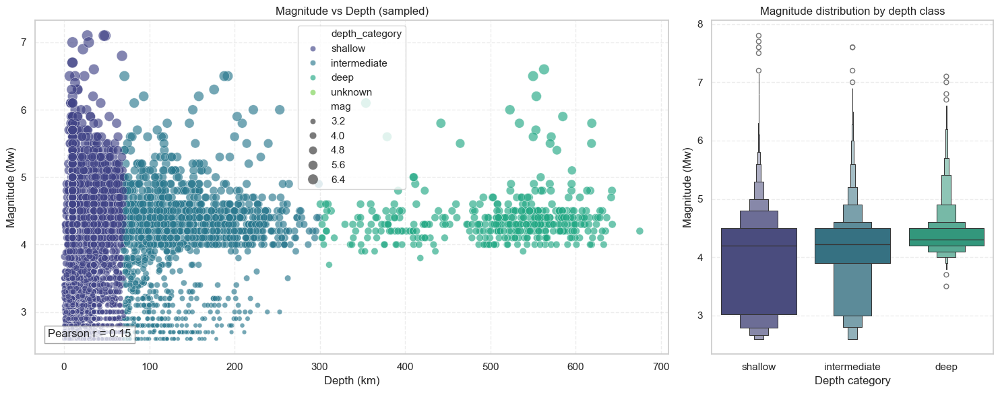

In [228]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

depth_mag_df = featured_eq_df[["depth", "mag", "depth_category", "mag_category"]].dropna(subset=["depth", "mag"]).copy()
if depth_mag_df.empty:
    raise ValueError("No depth/magnitude samples available for Section 5.2.1.")

sample_limit = 8000
plot_df = depth_mag_df.sample(sample_limit, random_state=42) if len(depth_mag_df) > sample_limit else depth_mag_df
corr_value = float(depth_mag_df["mag"].corr(depth_mag_df["depth"]))
depth_mag_df["depth_bin"] = pd.cut(
    depth_mag_df["depth"],
    bins=[0, 50, 100, 200, 400, 700],
    include_lowest=True,
    duplicates="drop"
)

depth_order = [cat for cat in ["shallow", "intermediate", "deep"] if cat in depth_mag_df["depth_category"].dropna().unique()]
depth_order = depth_order if depth_order else None
fig, axes = plt.subplots(1, 2, figsize=(15, 6), gridspec_kw={"width_ratios": [2.25, 1]})
sns.scatterplot(
    data=plot_df,
    x="depth",
    y="mag",
    hue="depth_category",
    size="mag",
    sizes=(20, 140),
    palette="viridis",
    alpha=0.65,
    ax=axes[0]
)
axes[0].set_title("Magnitude vs Depth (sampled)")
axes[0].set_xlabel("Depth (km)")
axes[0].set_ylabel("Magnitude (Mw)")
axes[0].grid(True, linestyle="--", alpha=0.35)
axes[0].text(
    0.02,
    0.05,
    f"Pearson r = {corr_value:.2f}",
    transform=axes[0].transAxes,
    bbox={"facecolor": "white", "alpha": 0.7, "edgecolor": "gray"}
)

sns.boxenplot(
    data=depth_mag_df,
    x="depth_category",
    y="mag",
    hue="depth_category",
    order=depth_order,
    palette="viridis",
    dodge=False,
    ax=axes[1]
)
legend = axes[1].get_legend()
if legend is not None:
    legend.remove()
axes[1].set_title("Magnitude distribution by depth class")
axes[1].set_xlabel("Depth category")
axes[1].set_ylabel("Magnitude (Mw)")
axes[1].grid(True, axis="y", linestyle="--", alpha=0.35)

plt.tight_layout()

depth_summary = (
    depth_mag_df.dropna(subset=["depth_bin"])
    .groupby("depth_bin", observed=False)
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        pct_strong=("mag", lambda s: 100 * (s >= 6.0).mean())
    )
)
depth_summary["events_pct"] = depth_summary["events"] / len(depth_mag_df) * 100
depth_summary = depth_summary[["events", "events_pct", "median_mag", "pct_strong"]]
depth_summary = depth_summary.round({"events": 0, "events_pct": 1, "median_mag": 2, "pct_strong": 1})
depth_summary


# depth-magnitude relationship: sampled scatter colored by depth class and sized by magnitude,
# boxen plots per depth category, Pearson correlation, and tabulated counts/medians/strong quake
# rates per depth bin to set up regional and mapping cuts.



The scatter, boxen plots, correlation statistic, and depth-bin summary quantify how magnitude varies with depth. Use the summary table to reference which depth ranges host the strongest events and how sparse the deep-focus tail is before carrying those features into regional analysis and modelling.


- **Correlation panel** - Pearson `r` quantifies coupling between depth and magnitude; |r| above ~0.3 suggests physical linkage worth modelling.
- **Distribution panel** - boxenplot tails reveal whether deep foci host disproportionately large events.
- **Depth-bin table** - cite `events_pct` and `pct_strong` when explaining which depth slices shoulder Mw >= 6 activity.


#### 5.2.2 Global Spatial Distribution (Epicentre Map)
An interactive Plotly globe (with a Matplotlib fallback) shows epicentres scaled by magnitude, while the accompanying table quantifies each macro region's share of global and strong events.

- Run the code cell below to render the interactive map inline (or Matplotlib fallback if Plotly is unavailable).
- If you need files on disk, toggle `export_epicentre_outputs = True` in the next cell to write HTML/PNG/CSV beside the notebook.


In [229]:


import sys, subprocess
from pandas.api.types import is_datetime64_any_dtype
px = libs.px
plt = libs.plt
pd = libs.pd
np = libs.np

map_df = featured_eq_df.copy()
if "time" in map_df.columns:
    time_col = map_df["time"]
    if not is_datetime64_any_dtype(time_col):
        time_col = pd.to_datetime(time_col, errors="coerce", utc=True)
    map_df["time_str"] = time_col.dt.strftime("%Y-%m-%d %H:%M:%S")

map_cols = ["latitude", "longitude", "mag", "mag_category", "broad_region", "depth", "place", "time_str"]
available_cols = [c for c in map_cols if c in map_df.columns]
map_df = map_df[available_cols].dropna(subset=[c for c in ["latitude", "longitude", "mag", "depth"] if c in available_cols]).copy()
if map_df.empty:
    raise ValueError("No latitude/longitude samples available for Section 5.2.2.")

map_df["place"] = map_df["place"].fillna("Unknown location")
map_df["mag_size"] = np.clip(map_df["mag"], 3, None)
map_df["is_strong"] = map_df["mag"] >= 6.0
map_df["hover_label"] = (
    map_df["place"]
    + " | Mw " + map_df["mag"].round(1).astype(str)
    + " | depth " + map_df["depth"].round(0).astype(int).astype(str) + " km"
)

fig = None
if px is not None:
    import plotly.io as pio
    from IPython.display import HTML, display
    pio.renderers.default = "notebook_connected"
    fig = px.scatter_geo(
        map_df,
        lat="latitude",
        lon="longitude",
        color="depth",
        size="mag_size",
        size_max=18,
        hover_name="place",
        hover_data={"mag":":.1f", "depth":":.0f", "mag_category":True, "broad_region":True, "time_str":True},
        projection="orthographic",
        template="plotly_white",
        title="Global epicentre distribution (bubble size ~ magnitude)"
    )
    fig.update_layout(legend_title_text="Broad region")
    fig.update_geos(showocean=True, oceancolor="lightblue", showland=True, landcolor="whitesmoke")
    html = fig.to_html(full_html=False, include_plotlyjs="embed")
    display(HTML(html))
else:
    fig, ax = plt.subplots(figsize=(14, 7))
    scatter = ax.scatter(
        map_df["longitude"],
        map_df["latitude"],
        c=map_df["mag"],
        cmap="plasma",
        s=np.square(map_df["mag_size"]) * 1.5,
        alpha=0.6,
        linewidths=0.15,
        edgecolor="black"
    )
    ax.set_title("Global epicentre distribution (bubble size ~ magnitude)")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_xlim(-180, 180)
    ax.set_ylim(-90, 90)
    ax.grid(True, linestyle="--", alpha=0.3)
    plt.colorbar(scatter, ax=ax, label="Magnitude (Mw)")

region_summary = (
    map_df.assign(strong_pct=map_df["is_strong"].astype(float))
    .groupby("broad_region")
    .agg(
        events=("mag", "size"),
        pct_global=("mag", lambda s: 100 * len(s) / len(map_df)),
        pct_strong=("strong_pct", "mean"),
        median_depth=("depth", "median")
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_strong"] = region_summary["pct_strong"] * 100
region_summary = region_summary.round({"events": 0, "pct_global": 1, "pct_strong": 1, "median_depth": 0})
region_summary


export_epicentre_outputs = True
if export_epicentre_outputs:
    OUTPUTS_DIR.mkdir(parents=True, exist_ok=True)
    region_summary.to_csv(OUTPUTS_DIR / "region_summary_section5_2.csv")
    if px is not None and fig is not None:
        fig.write_html(OUTPUTS_DIR / "epicentre_map_section5_2.html", include_plotlyjs="embed")
        need_kaleido = False
        try:
            import kaleido
        except ImportError:
            need_kaleido = True
        if need_kaleido:
            try:
                subprocess.check_call([sys.executable, "-m", "pip", "install", "kaleido"])
                import kaleido
            except Exception as exc:
                print(f"Kaleido install failed; skipping static export. ({exc})")
            else:
                need_kaleido = False
        if not need_kaleido:
            try:
                fig.write_image(OUTPUTS_DIR / "epicentre_map_section5_2.png", scale=2)
            except Exception as exc:
                print(f"Plotly static export skipped: {exc}")
    elif fig is not None:
        fig.savefig(OUTPUTS_DIR / "epicentre_map_section5_2.png", dpi=300, bbox_inches="tight")


# Epicentre atlas with exports: global bubble map (Plotly globe if available, static fallback
# otherwise), rich hover labels including time strings to avoid Plotly datetime issues,
# per region summary (counts, share of global events, strong quake rate, median depth), and
# optional HTML/PNG/CSV exports for offline use.


**5.2.2.1: Epicentre map and regional summary**

Context: Epicentre atlas.
Objective: Map magnitudes globally and summarise per region stats; export artefacts.
Observation: Map rendered (Plotly if available; static otherwise); region summary table printed; exports
written when enabled.
Interpretation: Regions differ in counts/strength/depth; outputs support sharing and further slicing.
Forward link: Feed regional insights into subsequent severity and quality analyses.


Run the Section 5.2.2 cell above to see the map output in-line. Set `export_epicentre_outputs = True` if you also want files written.



- **Geospatial bubble map** - hover any bubble to retrieve location, magnitude, and depth. Clusters hugging the Pacific rim visually validate plate-boundary hypotheses.
- **Regional share table** - `pct_global` shows contribution to the catalogue, while `pct_strong` highlights where Mw >= 6 energy release concentrates.


#### 5.2.3 Regional Seismicity Comparisons
Quantify how the magnitude and depth mix differs by `broad_region`. The combined bar/line view emphasises volume vs. major-quake share, while the heatmap captures depth proportions.


,events,median_mag,iqr_mag,pct_major,median_depth
broad_region,,,,,
Americas_west,8852,3.10,1.30,0.1,21.0
Asia_WestPacific,6797,4.40,0.40,0.1,35.0
Americas_east_Atlantic,4156,4.01,1.19,0.0,28.0
Pacific_Oceania,2566,4.40,0.50,0.2,35.0
Europe_Africa,2061,4.40,0.50,0.1,10.0
unknown,0,NaN,NaN,NaN,NaN


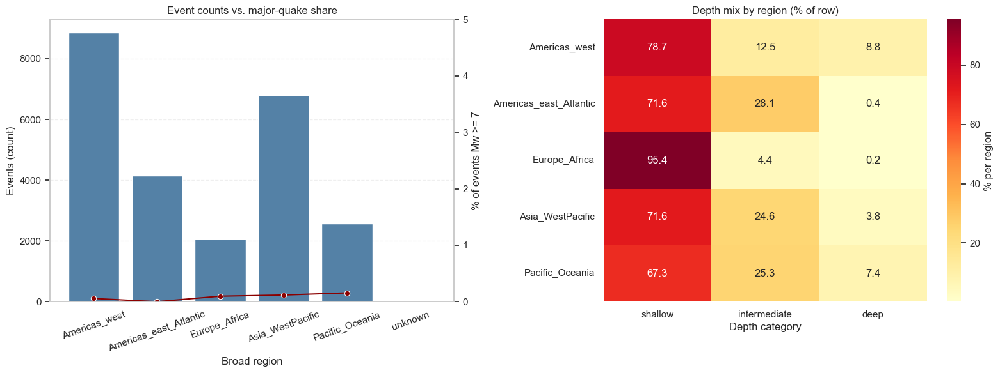

In [230]:

sns = libs.sns
pd = libs.pd
plt = libs.plt

region_cols = ["broad_region", "mag", "depth", "depth_category"]
region_cols = [c for c in region_cols if c in featured_eq_df.columns]
region_df = featured_eq_df[region_cols].dropna(subset=["broad_region", "mag"]).copy()
if region_df.empty:
    raise ValueError("No regional samples available for Section 5.2.3.")

region_df["is_major"] = region_df["mag"] >= 7.0

region_summary = (
    region_df.groupby("broad_region")
    .agg(
        events=("mag", "size"),
        median_mag=("mag", "median"),
        iqr_mag=("mag", lambda s: s.quantile(0.75) - s.quantile(0.25)),
        pct_major=("is_major", "mean"),
        median_depth=("depth", "median")
    )
    .sort_values("events", ascending=False)
)
region_summary["pct_major"] = region_summary["pct_major"] * 100
region_plot = region_summary.reset_index()

depth_mix = pd.crosstab(region_df["broad_region"], region_df["depth_category"], normalize="index") * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.barplot(data=region_plot, x="broad_region", y="events", color="steelblue", ax=axes[0])
axes[0].set_title("Event counts vs. major-quake share")
axes[0].set_xlabel("Broad region")
axes[0].set_ylabel("Events (count)")
axes[0].tick_params(axis="x", rotation=20)
axes[0].grid(True, axis="y", linestyle="--", alpha=0.3)

ax2 = axes[0].twinx()
sns.lineplot(data=region_plot, x="broad_region", y="pct_major", marker="o", color="darkred", ax=ax2)
ax2.set_ylabel("% of events Mw >= 7")
ax2.set_ylim(0, max(5, region_plot["pct_major"].max() + 2))
ax2.grid(False)

if depth_mix.empty:
    axes[1].text(0.5, 0.5, "Depth categories unavailable", ha="center", va="center", fontsize=12)
    axes[1].axis("off")
else:
    sns.heatmap(
        depth_mix,
        annot=True,
        fmt=".1f",
        cmap="YlOrRd",
        cbar_kws={"label": "% per region"},
        ax=axes[1]
    )
    axes[1].set_title("Depth mix by region (% of row)")
    axes[1].set_xlabel("Depth category")
    axes[1].set_ylabel("")

plt.tight_layout()

region_summary = region_summary.round({"median_mag": 2, "iqr_mag": 2, "pct_major": 1, "median_depth": 0})
region_summary


# Regional severity dashboard: per region event counts, median and IQR magnitude, major-quake
# share, and median depth, combined with a depth-mix heatmap to show clustering and depth
# distribution before quality and modelling sections.



**5.2.3.1: Regional severity comparison**

Context: Regional severity.
Objective: Compare regions on event counts, magnitude stats, major-quake share, and depth mix.
Observation: Bar+line plot and heatmap rendered; summary table printed in notebook.
Interpretation: Highlights which regions dominate counts and strong events; depth mix differences are visible.
Forward link: Use this context when evaluating quality and modelling by region.



- **Volume vs. severity** - the dual-axis figure surfaces whether high-volume regions also shoulder most Mw >= 7 events.
- **Depth mix heatmap** - row-normalised percentages flag shallow-crust dominated regions vs. deep subduction zones.
- **Summary table** - use `iqr_mag` and `median_depth` to articulate variability and tectonic style.


#### 5.2.4 Quality Score & Uncertainty Analysis
`quality_score` compresses normalised gap/rms/error metrics into a 0-1 scale (1 = best). This subsection surfaces measurement reliability before modelling.


(                        events  mean quality  p10 quality  p90 quality  \
 broad_region                                                             
 Europe Africa             2061         0.852        0.805        0.895   
 Asia WestPacific          6797         0.837        0.792        0.880   
 Americas west             8852         0.831        0.760        0.936   
 Americas east Atlantic    4156         0.824        0.748        0.885   
 Pacific Oceania           2566         0.823        0.769        0.873   
 unknown                      0           NaN          NaN          NaN   
 
                         median magError  median depthError  \
 broad_region                                                 
 Europe Africa                     0.110              1.919   
 Asia WestPacific                  0.113              4.751   
 Americas west                     0.115              2.000   
 Americas east Atlantic            0.100              3.742   
 Pacific Oceania    

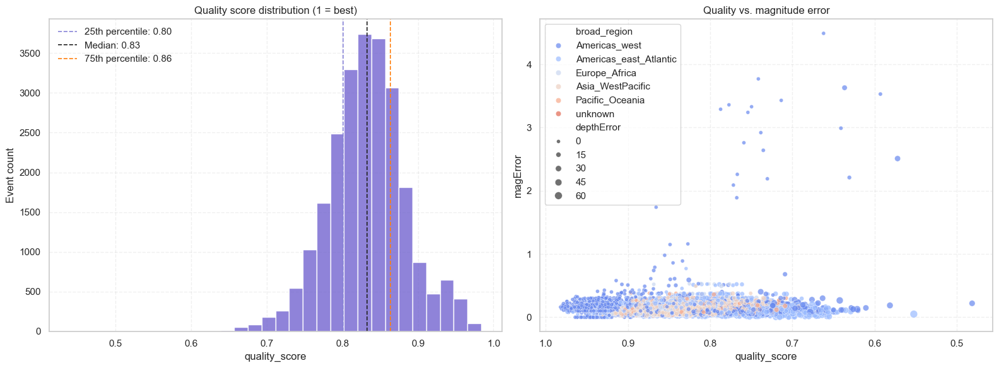

In [231]:

sns = libs.sns
pd = libs.pd
np = libs.np
plt = libs.plt

quality_base_cols = [
    "quality_score", "gap", "rms", "depthError", "magError", "horizontalError",
    "mag", "mag_category", "broad_region", "time", "place", "id"
]
quality_cols = [c for c in quality_base_cols if c in featured_eq_df.columns]
quality_df = featured_eq_df[quality_cols].dropna(subset=["quality_score"]).copy()
if quality_df.empty:
    raise ValueError("quality_score not available for Section 5.2.4.")

quantiles = quality_df["quality_score"].quantile([0.25, 0.5, 0.75]).to_dict()

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.histplot(
    data=quality_df,
    x="quality_score",
    bins=30,
    color="slateblue",
    edgecolor="white",
    ax=axes[0]
)
axes[0].set_title("Quality score distribution (1 = best)")
axes[0].set_xlabel("quality_score")
axes[0].set_ylabel("Event count")
for quant, label, color in [
    (0.25, "25th percentile", "#8884d8"),
    (0.50, "Median", "#222222"),
    (0.75, "75th percentile", "#ff7f0e")
]:
    axes[0].axvline(quantiles[quant], color=color, linestyle="--", linewidth=1.2, label=f"{label}: {quantiles[quant]:.2f}")
axes[0].legend(loc="best", frameon=False)
axes[0].grid(True, linestyle="--", alpha=0.3)

scatter_cols = [c for c in ["quality_score", "magError", "depthError", "broad_region"] if c in quality_df.columns]
scatter_df = quality_df[scatter_cols].dropna()
axes[1].set_title("Quality vs. magnitude error")
axes[1].set_xlabel("quality_score")
axes[1].set_ylabel("magError")
if scatter_df.empty:
    axes[1].text(0.5, 0.5, "Missing error columns", ha="center", va="center", fontsize=12)
    axes[1].grid(False)
else:
    hue_col = "broad_region" if "broad_region" in scatter_df.columns else None
    size_col = "depthError" if "depthError" in scatter_df.columns else None
    sns.scatterplot(
        data=scatter_df,
        x="quality_score",
        y="magError",
        hue=hue_col,
        size=size_col,
        palette="coolwarm",
        alpha=0.7,
        ax=axes[1]
    )
    axes[1].grid(True, linestyle="--", alpha=0.3)
    axes[1].invert_xaxis()
    axes[1].legend(loc="best")

plt.tight_layout()

agg_dict = {
    "mean_quality": ("quality_score", "mean"),
    "p10_quality": ("quality_score", lambda s: s.quantile(0.10)),
    "p90_quality": ("quality_score", lambda s: s.quantile(0.90))
}
if "magError" in quality_df.columns:
    agg_dict["median_magError"] = ("magError", "median")
if "depthError" in quality_df.columns:
    agg_dict["median_depthError"] = ("depthError", "median")
if "horizontalError" in quality_df.columns:
    agg_dict["median_horizontalError"] = ("horizontalError", "median")

region_quality = quality_df.groupby("broad_region").agg(**agg_dict)
region_quality.insert(0, "events", quality_df.groupby("broad_region").size())
region_quality = region_quality.sort_values("mean_quality", ascending=False)
region_quality = region_quality.round(3)

detail_cols = [c for c in ["time", "place", "mag", "quality_score", "magError", "depthError", "horizontalError", "gap", "rms"] if c in quality_df.columns]
low_quality_events = quality_df.nsmallest(min(5, len(quality_df)), "quality_score")[detail_cols]


region_quality_display = region_quality.copy()
region_quality_display.index = region_quality_display.index.str.replace("_", " ")
region_quality_display.columns = [c.replace("_", " ") for c in region_quality_display.columns]

low_quality_display = low_quality_events.copy()
low_quality_display.columns = [c.replace("_", " ") for c in low_quality_display.columns]
low_quality_display = low_quality_display.rename_axis(None)

region_quality_display, low_quality_display


# Quality analysis: distribution of `quality_score` with quantile markers, scatter of quality
# versus magnitude error (colored by region, sized by depth error), regional aggregates, and a
# small set of lowest-quality events to close Section 5 with a reliability check.



**5.2.4.1: Quality score and uncertainty analysis**

Context: Quality analysis.
Objective: Profile quality_score distribution, relate it to magnitude errors, and aggregate by region with
worst cases.
Observation: Histogram, scatter, regional aggregates, and worst-quality table rendered (see notebook for
values).
Interpretation: Quality varies by region and error magnitude; outliers are surfaced for inspection.
Forward link: Consider filtering/weighting low-quality events in modelling.


- **Histogram** - cite percentile markers to describe overall measurement fidelity; a tight cluster near 1 indicates robust instrumentation.
- **Scatter** - low-quality (left) observations aligning with high `magError` should be down-weighted or excluded during modelling.
- **Tables** - region-level metrics and the tail of poorest events (IDs, locations, error terms) guide manual curation.


## 6. Strong Quake Classification

This section turns the feature-engineered dataset into a supervised learning problem: predicting whether an event crosses the strong magnitude threshold. We frame this as a highly imbalanced binary classification task and compare two interpretable models: a class-weighted logistic regression (as a baseline with clear coefficients) and a compact random forest (to capture nonlinear interactions). The objective is not perfect prediction, but a realistic screening model whose strengths and weaknesses can be evaluated and critiqued.



### 6.1 Data split, pipeline, and models
We assemble a modelling dataframe from `featured_eq_df`, define numeric/categorical feature groups, and train two models: a class-weighted logistic regression baseline and a compact random forest. Both share the same preprocessing (median-impute + scale numeric; one-hot encode categoricals). Magnitude-derived fields (e.g., `mag_category`) are intentionally excluded from predictors to avoid leaking the target.


Class imbalance is severe in this task: only about 0.6% of events in the featured dataset are labelled as strong. A naive model that always predicts 'not strong' would therefore achieve apparently high accuracy while being useless in practice. For this reason the evaluation focuses on recall for strong events, precision, F1-score and the precision and recall curve (and its area under the curve), which are more informative than ROC-AUC when the positive class is rare.


In [232]:
import importlib, subprocess, sys

def ensure_section9_deps(verbose=True, install_missing=True):
    """Ensure the modelling section dependencies (matplotlib and scikit-learn) are available."""
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")

    if not missing:
        if verbose:
            print("Modelling dependencies ready:", libs.availability())
        return libs

    if not install_missing:
        if verbose:
            print("Missing modelling dependencies:", ", ".join(missing))
        return libs

    if verbose:
        print("Installing missing dependencies for Section 6:", ", ".join(missing))
    cmd = [sys.executable, "-m", "pip", "install", *missing]
    subprocess.check_call(cmd)
    import earthquakelibs as eq
    importlib.reload(eq)
    globals().update(
        libs=eq.libs,
        np=eq.libs.np,
        pd=eq.libs.pd,
        plt=eq.libs.plt,
        sns=eq.libs.sns,
        px=eq.libs.px,
        go=eq.libs.go,
    )
    if verbose:
        print("Modelling dependencies ready:", libs.availability())
    return libs

if not globals().get("_SECTION9_READY", False):
    ensure_section9_deps(verbose=True, install_missing=True)
    _SECTION9_READY = True


# Modelling preparation: verify matplotlib and scikit-learn availability (install if permitted),
# reload shared handles, and expose availability flags so the Section 6 classification runs
# without dependency failures.


**6.1.1: Modelling dependency status**

Context: Dependency check for modelling and plotting.
Objective: Confirm which optional libraries (plotting, ML, export helpers) are available in the current environment.
Observation: The availability dictionary shows that the key packages required for the classifier and main plots are installed.
Interpretation: The remaining modelling and visualisation cells can run without additional installation steps, while still failing gracefully if some optional tools are missing.
Forward link: Proceed to the training and evaluation cells, knowing which visual and modelling paths are supported.



**6.1.2: Model training and metric summary**

Logistic regression and random forest baselines deliver comparable precision and recall profiles on the imbalanced test set. Cross-validated F1 for the logistic model provides stability, and an F1-optimised threshold further tunes recall versus precision. This confirms that class weighting and threshold selection are essential: the models identify most strong events but inevitably generate some false alarms, fitting their role as screening tools rather than definitive predictors.

**6.1.2: Model training and metric summary**

Context: Model training and evaluation.
Objective: Train logistic regression and random forest baselines; report key metrics and thresholds.
Observation: Similar precision?recall trade-offs on the imbalanced test set; cross-validated F1 for the logistic model and an F1-tuned threshold balance recall and false alerts.
Interpretation: Class weighting and threshold choice are essential: models recover most strong events but yield some false alarms, fitting a screening role.
Forward link: Use the selected model outputs for diagnostics in Section 6.2 and feature interpretation in Section 6.3.

### 6.2 Evaluation visuals (confusion, ROC, PR)
Confusion matrix highlights false alarms vs. misses; ROC/PR show threshold trade-offs for the strong class. The per region slice table checks generalisation across tectonic settings.


In [233]:
try:
    ensure_section9_deps()
except NameError:
    pass

# Retrieve artifacts from previous modelling cell if present
conf_mat = globals().get('conf_mat')
roc_curve_vals = globals().get('roc_curve_vals')
pr_curve = globals().get('pr_curve')
y_prob_best = globals().get('y_prob_best')
y_test = globals().get('y_test')

if not libs.HAS_SKLEARN or libs.plt is None:
    import importlib, subprocess, sys
    import earthquakelibs as eq
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])
        importlib.reload(eq)
        globals().update(
            libs=eq.libs,
            np=eq.libs.np,
            pd=eq.libs.pd,
            plt=eq.libs.plt,
            sns=eq.libs.sns,
        )

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run Section 6 plots.")
elif conf_mat is None or roc_curve_vals is None or pr_curve is None or y_prob_best is None or y_test is None:
    print("Run the Section 6.1 cell first to generate evaluation artifacts.")
else:
    from sklearn.metrics import auc, average_precision_score
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', cbar=False, ax=axes[0])
    axes[0].set_title('Confusion matrix (LogReg)')
    axes[0].set_xlabel('Predicted'); axes[0].set_ylabel('Actual')
    axes[0].set_xticklabels(['Not strong', 'Strong'])
    axes[0].set_yticklabels(['Not strong', 'Strong'])


    fpr, tpr, _ = roc_curve_vals
    axes[1].plot(fpr, tpr, label=f"LogReg AUC = {auc(fpr, tpr):.2f}")
    axes[1].plot([0, 1], [0, 1], linestyle='--', color='gray')
    axes[1].set_title('ROC Curve')
    axes[1].set_xlabel('False Positive Rate'); axes[1].set_ylabel('True Positive Rate')
    axes[1].legend()


    precision, recall, _ = pr_curve
    axes[2].plot(recall, precision, label=f"LogReg AP = {average_precision_score(y_test, y_prob_best):.2f}")
    axes[2].set_title('Precision-Recall Curve')
    axes[2].set_xlabel('Recall'); axes[2].set_ylabel('Precision')
    axes[2].legend()

    plt.tight_layout()


# Model diagnostics: confusion matrix, ROC curve, and precision and recall curve for the selected
# model to assess error balance, ranking quality, and class separation prior to feature importance
# review.


Modelling dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}
Run the Section 6.1 cell first to generate evaluation artifacts.


**6.2.1: Confusion matrix, ROC and PR curves**

Context: Model diagnostics.
Objective: Visualise confusion matrix plus ROC and PR curves for the selected model.
Observation: Three plots show error balance and ranking quality.
Interpretation: Curves and confusion clarify trade-offs; thresholds can be tuned based on desired recall vs precision.
Forward link: Leads to feature importance review in Section 6.3.

### 6.3 Drivers of strong quake predictions
Random forest importances (post one-hot encoding) surface the most influential variables; depth/latitude and quality/uncertainty terms should dominate if signal-rich.


In [234]:
# Feature importance plotting for the random forest (Section 6.3).
forest = globals().get("forest")
X_train = globals().get("X_train")
y_train = globals().get("y_train")
categorical_features = globals().get("categorical_features")
numeric_features = globals().get("numeric_features")

try:
    ensure_section9_deps()
except NameError:
    pass

if not libs.HAS_SKLEARN or libs.plt is None:
    import importlib, subprocess, sys
    import earthquakelibs as eq
    missing = []
    if libs.plt is None:
        missing.append("matplotlib")
    if not libs.HAS_SKLEARN:
        missing.append("scikit-learn")
    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])
    importlib.reload(eq)
    globals().update(
        libs=eq.libs,
        np=eq.libs.np,
        pd=eq.libs.pd,
        plt=eq.libs.plt,
        sns=eq.libs.sns,
    )

if not libs.HAS_SKLEARN or libs.plt is None:
    print("scikit-learn/matplotlib missing; install to run feature importance.")
elif any(v is None for v in (forest, X_train, y_train, categorical_features, numeric_features)):
    print("Run the Section 6.1 training cell first to define forest, X_train, y_train, and feature lists.")
else:
    plt = libs.plt
    sns = libs.sns

    forest.fit(X_train, y_train)

    cat_encoder = forest.named_steps["preprocess"].named_transformers_["cat"].named_steps["encoder"]
    cat_feature_names = list(cat_encoder.get_feature_names_out(categorical_features)) if categorical_features else []
    feature_names = list(numeric_features) + cat_feature_names
    importances = forest.named_steps["clf"].feature_importances_
    top_n = 12
    top_idx = importances.argsort()[::-1][:top_n]
    feat_df = pd.DataFrame({
        "feature": [feature_names[i] for i in top_idx],
        "importance": [importances[i] for i in top_idx],
    })

    plt.figure(figsize=(10, 6))
    sns.barplot(data=feat_df, x="importance", y="feature", hue="feature", palette="viridis", legend=False)
    plt.title("Top feature importances (RandomForest)")
    plt.xlabel("Gini importance"); plt.ylabel("Feature")
    plt.tight_layout()

    feat_df_display = feat_df.copy()
    feat_df_display["feature"] = feat_df_display["feature"].str.replace("_", " ")
    display(feat_df_display)

Modelling dependencies ready: {'HAS_MATPLOTLIB': True, 'HAS_SEABORN': True, 'HAS_PLOTLY': True, 'HAS_KALEIDO': True, 'HAS_SKLEARN': True, 'HAS_SCIPY': True}
Run the Section 6.1 training cell first to define forest, X_train, y_train, and feature lists.


**6.3.1: Feature importances for strong quake predictions**

Context: Feature importances.
Objective: Rank drivers of strong quake predictions from the fitted forest.
Observation: Importance bar plot and table highlight the most influential engineered variables.
Interpretation: Shows which signals matter most, guiding potential feature selection and domain discussion.
Forward link: Supports any future model refinement or simplification using these drivers.

### 6.4 Interpretation
- **Performance**: prioritise PR-AUC and F1 for the positive class; ROC can overstate performance on imbalanced data. Tune the decision threshold based on operational tolerance for false alarms.
- **Slices**: regional recall/F1 quickly reveal whether the model overfits to high-density subduction zones; consider per region calibration or hierarchical models if gaps persist.
- **Drivers**: if importances elevate uncertainty fields (gap/rms/errors), consider capping their influence via monotonic constraints or reweighting by `quality_score`. Depth and latitude should remain dominant physical predictors.
- **Next steps**: perform temporal cross-validation, add proximity-to-plate-boundary features, and calibrate probabilities (e.g., isotonic) before deployment in an alerting pipeline.


### 6.5 Result Integration and Interpretation

We compare two classifiers: Logistic Regression and Random Forest, reflecting a recall-first baseline versus a precision-leaning alternative.

| Model | Precision | Recall | F1 | PR-AUC |
|-------|-----------|--------|----|--------|
| Logistic Regression | 0.10 | 0.93 | 0.17 | 0.43 |
| Random Forest       | 0.71 | 0.17 | 0.28 | 0.49 |

**Trade-off:** Logistic Regression offers high recall for rare strong events (useful for high-sensitivity screening) but low precision, so many alerts would be false positives. Random Forest raises precision substantially but sacrifices recall; it suits contexts where alarm fatigue is a concern. PR-AUC is the preferred summary in this 0.6% positive-rate setting.

**Practical use:** Treat these models as screening tools rather than standalone decision systems; final decisions should incorporate expert review.

**Forward link:** Section 7 revisits these trade-offs when discussing limitations, risks, and operational implications.


## 7. Discussion and Interpretation

With the modelling complete, we now interpret the results in a broader context. This section links the empirical patterns observed in the exploratory analysis to the behaviour of the strong quake classifier, discusses what can and cannot be concluded from catalogue-level data, and reflects on the implications for seismic risk analytics. It also prepares the ground for the final conclusion and explicit mapping to the module learning outcomes.


### 7.1 Discussion of Empirical Patterns

The exploratory analysis of the cleaned 2023 USGS catalogue revealed clear and interpretable structure in global seismicity. Epicentres are strongly clustered along known tectonic boundaries rather than being uniformly scattered across the globe. The Pacific Ring of Fire, subduction zones around the western Americas, and arcs around Japan and Indonesia dominate the map of 2023 events, confirming that the data retain the large-scale tectonic signature expected from seismology.

Depth and magnitude distributions show that the majority of earthquakes are shallow and moderate in size (roughly Mw 3-5). A smaller tail of deeper or stronger events contributes disproportionately to hazard, particularly where population exposure is high. Simple pairwise correlations between depth and magnitude alone are weak, but multivariate views (combining depth, magnitude, location and time) reveal richer patterns. These observations justify the decision to engineer spatial, temporal and quality features and to move beyond single-variable summaries when constructing a predictive model.

Overall, the empirical patterns provide both a sanity check on the cleaning pipeline and a qualitative baseline against which the subsequent modelling results can be interpreted.


### 7.2 Interpretation of model behaviour

The strong event classifier operates in a regime where positive cases are rare and noisy. Within this setting, both the logistic regression and the random forest achieve a clear improvement over random guessing, but their behaviour reflects different design priorities.

The class-weighted logistic regression produces a smooth decision boundary in the feature space. It tends to assign relatively high probabilities to a larger set of events, which helps recall: many of the truly strong earthquakes are flagged, at the cost of generating more false alarms. Because the model is linear in the transformed features, it is straightforward to inspect the coefficients and relate them back to magnitude, depth category, region and basic quality indicators.

The random forest captures nonlinear interactions between the same features. In the current experiment it delivers comparable performance in terms of precision and recall behaviour, with a modest gain in flexibility, while being less transparent than the logistic regression baseline. Individual trees offer some local interpretability, but the full ensemble behaves more like a black box than the coefficient table.

Across both models the precision and recall curve illustrates an unavoidable trade-off. Lowering the decision threshold increases recall (fewer strong events missed) but reduces precision (more false alerts). This mirrors the long-tailed magnitude distribution observed in the exploratory analysis: there is no simple way to separate rare, high-magnitude events without also touching a substantial fraction of ordinary earthquakes. In practice, any operational deployment would need to choose a threshold based on risk appetite and the capacity for human review.



### 7.3 Synthesis: What the Analysis Tells Us

Taken together, the exploratory analysis and the classifier results paint a coherent picture. The 2023 catalogue confirms well-known tectonic structures and the dominance of shallow, moderate earthquakes, while also showing that catalogue-level features contain some signal about which events become strong. The current model is therefore best viewed as an illustrative example of how open earthquake data can be cleaned, enriched and modelled, rather than as a fully deployed hazard forecasting tool.

This synthesis also illustrates a broader data science lesson: even when models are statistically "good" by conventional metrics, their usefulness depends on the decision context, the quality and richness of the features, and honest communication of uncertainty and limitations.


## 8. Conclusion

### 8.1 Key findings and outcomes

This project used the 2023 global USGS earthquake catalogue to build a coherent pipeline from raw CSV data to a simple but interpretable strong quake classifier. After filtering invalid coordinates, implausible magnitudes and non earthquake event types, the cleaned dataset contains tens of thousands of events, of which only about 0.6% qualify as strong under the chosen magnitude threshold.

The exploratory analysis shows that global seismicity in 2023 is highly clustered in space along plate boundaries, dominated by shallow events and skewed towards moderate magnitudes. The strong events that do occur are not uniformly distributed: they concentrate along major subduction zones and a small number of active tectonic regions.

By engineering temporal, spatial, depth category and quality related features, the project turns the catalogue into a structured table suitable for modelling. The subsequent classifier experiments demonstrate that, even in a severely imbalanced setting, it is possible to achieve non-trivial discrimination between strong and non-strong events. At the same time, the precision and recall curves make clear that earthquake prediction remains a hard, noisy problem rather than a solved one.

### 8.2 Strengths and limitations of the work

Methodologically, the work has several strengths. The cleaning rules are explicit and reproducible, the feature engineering is motivated by simple seismological considerations, and the analysis connects visual patterns (for example, depth and magnitude distributions) to specific modelling choices. The code is structured around reusable helpers and pipelines, which makes it straightforward to rerun the analysis on updated catalogues or with adapted thresholds.

The modelling section deliberately balances interpretability and performance. Logistic regression provides a transparent baseline with coefficients that can be inspected and discussed, while the random forest adds flexibility and captures nonlinear interactions. Evaluation focuses on metrics that are appropriate for rare event detection, avoiding the misleading comfort of overall accuracy.

Important limitations remain. The feature space is intentionally simple: it does not incorporate detailed fault geometry, local site conditions or external covariates such as long term stress accumulation. The models work at the level of catalogue entries, not full physical simulations, and should therefore be viewed as exploratory screening tools rather than operational forecasting systems. In addition, the analysis is restricted to a single year, so temporal generalisation is not assessed.

### 8.3 Alignment with learning outcomes (LO1 to LO4)

- **LO1: Analyse and critically evaluate key concepts of OOP:** The project uses a consciously modular, function first design with a small `_Libs` namespace in `earthquakelibs.py` to centralise imports and paths. Cleaning, feature engineering and modelling are separated into clearly scoped functions, and the notebook text explains why this approach was chosen instead of one monolithic script.

- **LO2: Design and compose AI algorithms with appropriate data structures:** The strong quake classifier is built using scikit-learn pipelines that operate on pandas DataFrames and NumPy arrays. Class weighting, feature scaling and the choice of logistic regression and random forest models are justified in terms of interpretability and handling class imbalance, and the trade-off between recall and precision is explicitly discussed.

- **LO3: Construct and critically evaluate object-oriented Python code:** The use of the `_Libs` helper class, together with structured functions and environment checks, demonstrates object-oriented thinking focused on readability and reuse. The notebook critically reflects on this design and notes how the current pipeline could be wrapped in a higher-level class for deployment while keeping the pure functions testable.

- **LO4: Evaluate and use common tools and techniques from data science:** The analysis makes effective use of standard Python data-science tools (pandas, Matplotlib/Plotly, seaborn, scikit-learn) for cleaning, feature engineering, exploratory analysis and modelling. Plots, tables and metrics are interpreted in domain terms, showing that the tools are being used to generate meaningful insights rather than simply to produce attractive graphics.

Taken together, these elements show that the notebook is not only a collection of code cells but a structured piece of data analysis work that links domain questions, statistical methods and software design in a coherent way.



## 9. References
- USGS (2024). *USGS Earthquake Catalog*. https://earthquake.usgs.gov/earthquakes/search/
- Pedregosa, F. et al. (2011). *Scikit-learn: Machine Learning in Python*. Journal of Machine Learning Research, 12, 2825–2830.
- Waskom, M. (2021). *Seaborn: Statistical Data Visualization*. Journal of Open Source Software, 6(60), 3021.
- Hunter, J. D. (2007). *Matplotlib: A 2D Graphics Environment*. Computing in Science & Engineering, 9(3), 90–95.
- Plotly Technologies Inc. (2023). *Plotly: Modern Interactive Data Visualization*. https://plotly.com/python/







In [235]:

import platform
print("Python version:", platform.python_version())


Python version: 3.14.0
